In [2]:
import scipy.io
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os

In [3]:
# f = "/mnt/c/Users/tomasz/OneDrive - University of Edinburgh/model_RNAPI_matlab/20230112_termination_simulations/Data20230112/2023_1_12_13_15_58.mat"
# mat = scipy.io.loadmat(f)
# mat['Data'][0][0][10]

# data pre-processing

In [4]:
def parseMatOutput(filePath):
    names = ['sigma','lenValue','outOfBound','rpa12Cleavage','minRange','RNAPbubble','hybridFile','saveHistOnly','nRuns','tMax','dt','structureFile','c','dist','v5end','addProb','vInt','preTermProb','preTermDist','backtrackingVelocity','rnt1Cleavage','structure2consider','structureStrength','hybridStrength','name']

    mat = scipy.io.loadmat(filePath)
    ### order ###
    # mids, rhoFull, dxAvgFull, structureFull, hybridFull, windingFull, backtrackingFull, backtrackingFullRaw, collistionsFull, collisionsFullRaw
    
    #output full
    output_full = pd.DataFrame(index=mat['Data'][0][0][0][0])
    output = pd.DataFrame()
    params = pd.DataFrame(index=names)

    for n,i in enumerate(mat['Data'][0][0][1]): #rhoFull
        output_full['data_'+str(n)] = i
    
    #output
    output['nParticles'] = [i[0] for i in mat['Data'][0][0][10]]
    output['xEnd'] = [i[0] for i in mat['Data'][0][0][11]]
    output['xEndPremature'] = [i[0] for i in mat['Data'][0][0][12]]
    output['tTaken'] = [pd.Series(i).mean() for i in mat['Data'][0][0][13].T]
    
    #parameters  
    param_temp = [i[0] for i in mat['Data'][0][0][14][0][0]]
    
    param_clean = []
    for i in param_temp:
        if type(i) == np.ndarray:           
            param_clean.append(i[0])
        else:
            param_clean.append(i)

    params['run'] = param_clean
   
    return output, params, output_full.mean(1)


#Dell
# path = "/mnt/c/Users/tomasz/OneDrive - University of Edinburgh/model_RNAPI_matlab/20230112_termination_simulations/Data20230113/"

#ThinkPad
path = "/mnt/c/Users/tturo/OneDrive - INSTYTUT BIOCHEMII I BIOFIZYKI PAN/model_RNAPI_matlab/20230112_termination_simulations/Data_20230201/"

df00_output = pd.DataFrame()
df01_plots = pd.DataFrame()
for f in os.listdir(path):
    if f.endswith(".mat"):
        output, params, output_full = parseMatOutput(path+f)

        params = params.to_dict()['run']
        
        #coefficient to multiply nRuns 
        if params['tMax'] == 6000:
            coef = (150 * 0.5) / params['nRuns']
        else:
            exit("tMax different than 6000")
        
        data = {
            'time'        : params['tMax'],
            'c'           : params['c'],
            'dist'        : params['dist'],
            'v5end'       : params['v5end'],
            'addProb'     : params['addProb'],
            'vInt'        : params['vInt'],
            'preTermProb' : params['preTermProb'],
            'preTermDist' : params['preTermDist'],
            'nParticles'    : output['nParticles'].mean(),
            'xEnd'          : output['xEnd'].sum() * coef,
            'xEndPremature' : output['xEndPremature'].sum() * coef,
            'tTaken'        : output['tTaken'].mean()
        }
               
        df00_output[params['name']] = pd.Series(data)
        df01_plots[params['name']] = output_full
                
df00_output

/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df00_output[params['name']] = pd.Series(data)
/tmp/ipykernel_189/2319785804.py:73: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df01_plots[params['name']] = output_full
/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fram

/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df00_output[params['name']] = pd.Series(data)
/tmp/ipykernel_189/2319785804.py:73: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df01_plots[params['name']] = output_full
/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fram

/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df00_output[params['name']] = pd.Series(data)
/tmp/ipykernel_189/2319785804.py:73: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df01_plots[params['name']] = output_full
/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fram

/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df00_output[params['name']] = pd.Series(data)
/tmp/ipykernel_189/2319785804.py:73: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df01_plots[params['name']] = output_full
/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fram

/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df00_output[params['name']] = pd.Series(data)
/tmp/ipykernel_189/2319785804.py:73: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df01_plots[params['name']] = output_full
/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fram

/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df00_output[params['name']] = pd.Series(data)
/tmp/ipykernel_189/2319785804.py:73: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df01_plots[params['name']] = output_full
/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fram

/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df00_output[params['name']] = pd.Series(data)
/tmp/ipykernel_189/2319785804.py:73: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df01_plots[params['name']] = output_full
/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fram

/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df00_output[params['name']] = pd.Series(data)
/tmp/ipykernel_189/2319785804.py:73: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df01_plots[params['name']] = output_full
/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fram

/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df00_output[params['name']] = pd.Series(data)
/tmp/ipykernel_189/2319785804.py:73: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df01_plots[params['name']] = output_full
/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fram

/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df00_output[params['name']] = pd.Series(data)
/tmp/ipykernel_189/2319785804.py:73: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df01_plots[params['name']] = output_full
/tmp/ipykernel_189/2319785804.py:72: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fram

,discrete_0.1,discrete_0.2,discrete_0.3,discrete_0.4,discrete_0.5,discrete_0.6,discrete_0.7,discrete_0.8,discrete_0.9,discrete_1.0,...,fullnoLTRpreElong_0.8_term_2,fullnoLTRpreElong_0.8_term_0.01,fullnoLTRpreElong_0.8_term_6,fullnoLTRpreElong_0.8_term_7,fullnoLTRpreElong_0.8_term_8,fullnoLTRpreElong_0.8_term_9,fullnoLTRpreElong_0.8_term_10,fullnoLTRpreElong_0.8_term_3,fullnoLTRpreElong_0.8_term_4,fullnoLTRpreElong_0.8_term_5
time,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,...,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000
c,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000
dist,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
v5end,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
addProb,0.100000,0.200000,0.300000,0.400000,0.500000,0.600000,0.700000,0.800000,0.900000,1.000000,...,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000
vInt,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,...,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000
preTermProb,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.000000,0.010000,6.000000,7.000000,8.000000,9.000000,10.000000,3.000000,4.000000,5.000000
preTermDist,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
nParticles,13.390750,24.859500,34.819437,43.351312,51.289812,57.821500,64.600625,71.213625,77.282312,81.566938,...,34.194250,51.415062,18.407500,16.345312,14.510125,12.948562,11.532437,28.847812,24.557125,21.082375
xEnd,40673.437500,75304.687500,105323.437500,130875.000000,154696.875000,174056.250000,193204.687500,208654.687500,223073.437500,236517.187500,...,128371.875000,199209.375000,64420.312500,56615.625000,49340.625000,43453.125000,38020.312500,106350.000000,88921.875000,74901.562500


In [5]:
#processivity
df00_output = df00_output.T
df00_output['processivity'] = df00_output['xEnd'] / (df00_output['xEnd'] + df00_output['xEndPremature'])
df00_output = df00_output.T
df00_output

,discrete_0.1,discrete_0.2,discrete_0.3,discrete_0.4,discrete_0.5,discrete_0.6,discrete_0.7,discrete_0.8,discrete_0.9,discrete_1.0,...,fullnoLTRpreElong_0.8_term_2,fullnoLTRpreElong_0.8_term_0.01,fullnoLTRpreElong_0.8_term_6,fullnoLTRpreElong_0.8_term_7,fullnoLTRpreElong_0.8_term_8,fullnoLTRpreElong_0.8_term_9,fullnoLTRpreElong_0.8_term_10,fullnoLTRpreElong_0.8_term_3,fullnoLTRpreElong_0.8_term_4,fullnoLTRpreElong_0.8_term_5
time,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,...,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000,6000.000000
c,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000,500.000000
dist,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
v5end,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
addProb,0.100000,0.200000,0.300000,0.400000,0.500000,0.600000,0.700000,0.800000,0.900000,1.000000,...,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000,0.800000
vInt,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,...,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000
preTermProb,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.000000,0.010000,6.000000,7.000000,8.000000,9.000000,10.000000,3.000000,4.000000,5.000000
preTermDist,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
nParticles,13.390750,24.859500,34.819437,43.351312,51.289812,57.821500,64.600625,71.213625,77.282312,81.566938,...,34.194250,51.415062,18.407500,16.345312,14.510125,12.948562,11.532437,28.847812,24.557125,21.082375
xEnd,40673.437500,75304.687500,105323.437500,130875.000000,154696.875000,174056.250000,193204.687500,208654.687500,223073.437500,236517.187500,...,128371.875000,199209.375000,64420.312500,56615.625000,49340.625000,43453.125000,38020.312500,106350.000000,88921.875000,74901.562500


# Data exploration

<AxesSubplot:>

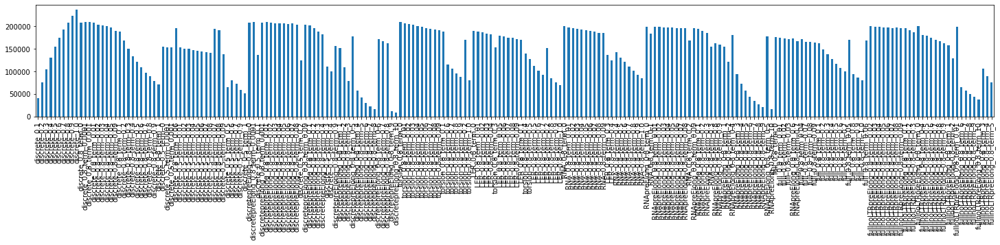

In [6]:
df00_output.T['xEnd'].plot.bar(figsize=(25,3))

In [7]:
modelType = df00_output.columns.to_series().str.split("_",expand=True)[0]
a = df00_output.T
a['modelType'] = modelType
df00_output = a.T
df00_output

,discrete_0.1,discrete_0.2,discrete_0.3,discrete_0.4,discrete_0.5,discrete_0.6,discrete_0.7,discrete_0.8,discrete_0.9,discrete_1.0,...,fullnoLTRpreElong_0.8_term_2,fullnoLTRpreElong_0.8_term_0.01,fullnoLTRpreElong_0.8_term_6,fullnoLTRpreElong_0.8_term_7,fullnoLTRpreElong_0.8_term_8,fullnoLTRpreElong_0.8_term_9,fullnoLTRpreElong_0.8_term_10,fullnoLTRpreElong_0.8_term_3,fullnoLTRpreElong_0.8_term_4,fullnoLTRpreElong_0.8_term_5
time,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,...,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0,6000.0
c,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,500.0,500.0,500.0,500.0,500.0,500.0,500.0,500.0,500.0,500.0
dist,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
v5end,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
addProb,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,...,0.8,0.8,0.8,0.8,0.8,0.8,0.8,0.8,0.8,0.8
vInt,50.0,50.0,50.0,50.0,50.0,50.0,50.0,50.0,50.0,50.0,...,50.0,50.0,50.0,50.0,50.0,50.0,50.0,50.0,50.0,50.0
preTermProb,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,0.01,6.0,7.0,8.0,9.0,10.0,3.0,4.0,5.0
preTermDist,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0
nParticles,13.39075,24.8595,34.819437,43.351312,51.289812,57.8215,64.600625,71.213625,77.282312,81.566938,...,34.19425,51.415062,18.4075,16.345312,14.510125,12.948562,11.532437,28.847812,24.557125,21.082375
xEnd,40673.4375,75304.6875,105323.4375,130875.0,154696.875,174056.25,193204.6875,208654.6875,223073.4375,236517.1875,...,128371.875,199209.375,64420.3125,56615.625,49340.625,43453.125,38020.3125,106350.0,88921.875,74901.5625


In [8]:
df00_output.T['modelType'].unique()

array(['discrete', 'discretepreElong', 'torsion', 'LER', 'RNA',
       'RNApreElong', 'full', 'fullnoLTRpreElong'], dtype=object)

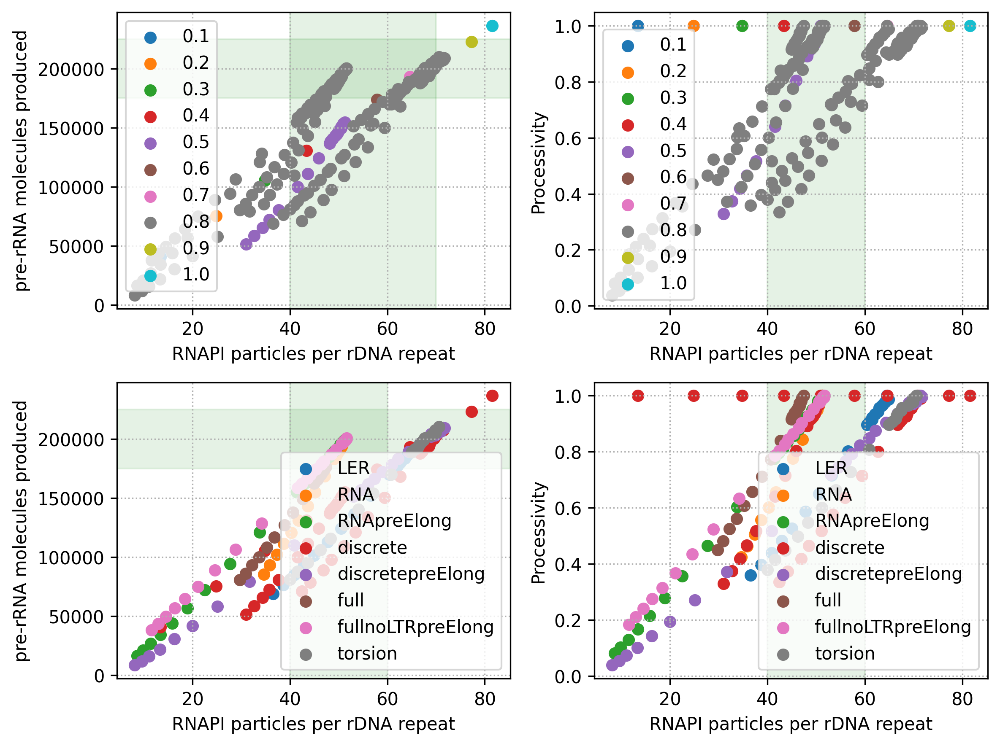

In [9]:
figsize=(8,6)
texts = []
data = df00_output.T
title = ''

fig = plt.figure(figsize=figsize, dpi=300)

#panel 1
ax1 = fig.add_subplot(2,2,1)
ax1.axvspan(40,70,color='green',alpha=0.1)
ax1.axhspan(175000,225000,color='green',alpha=0.1)

for group, df_temp in data.groupby('addProb'):
    a = df_temp['nParticles'].tolist()
    b = df_temp['xEnd'].tolist()
    ax1.scatter(x=a ,y=b ,label=group, cmap="paired")
#     for x, y, s in zip(a, b, df_temp.index.tolist()):
#         texts.append(plt.text(x, y, s))

ax1.legend()
ax1.grid(True,ls="dotted")
ax1.set_xlabel('RNAPI particles per rDNA repeat')
ax1.set_ylabel('pre-rRNA molecules produced')

#panel 2
ax2 = fig.add_subplot(2,2,2)
ax2.axvspan(40,60,color='green',alpha=0.1)
# ax1.axhspan(0,1,color='green',alpha=0.1)

for group, df_temp in data.groupby('addProb'):
    a = df_temp['nParticles'].tolist()
    b = df_temp['processivity'].tolist()
    ax2.scatter(x=a ,y=b ,label=group, cmap="paired")
#     for x, y, s in zip(a, b, df_temp.index.tolist()):
#         texts.append(plt.text(x, y, s))

ax2.legend()
ax2.grid(True,ls="dotted")
ax2.set_xlabel('RNAPI particles per rDNA repeat')
ax2.set_ylabel('Processivity')

#panel 3
ax1 = fig.add_subplot(2,2,3)
ax1.axvspan(40,60,color='green',alpha=0.1)
ax1.axhspan(175000,225000,color='green',alpha=0.1)

for group, df_temp in data.groupby('modelType'):
    a = df_temp['nParticles'].tolist()
    b = df_temp['xEnd'].tolist()
    ax1.scatter(x=a ,y=b ,label=group, cmap="paired")
#     for x, y, s in zip(a, b, df_temp.index.tolist()):
#         texts.append(plt.text(x, y, s))

ax1.legend()
ax1.grid(True,ls="dotted")
ax1.set_xlabel('RNAPI particles per rDNA repeat')
ax1.set_ylabel('pre-rRNA molecules produced')

#panel 4
ax2 = fig.add_subplot(2,2,4)
ax2.axvspan(40,60,color='green',alpha=0.1)
# ax1.axhspan(0,1,color='green',alpha=0.1)

for group, df_temp in data.groupby('modelType'):
    a = df_temp['nParticles'].tolist()
    b = df_temp['processivity'].tolist()
    ax2.scatter(x=a ,y=b ,label=group, cmap="paired")
#     for x, y, s in zip(a, b, df_temp.index.tolist()):
#         texts.append(plt.text(x, y, s))

ax2.legend()
ax2.grid(True,ls="dotted")
ax2.set_xlabel('RNAPI particles per rDNA repeat')
ax2.set_ylabel('Processivity')

plt.title(title)
plt.tight_layout()
# adjust_text(texts, only_move={'points':'y', 'texts':'y'}, arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
plt.show()

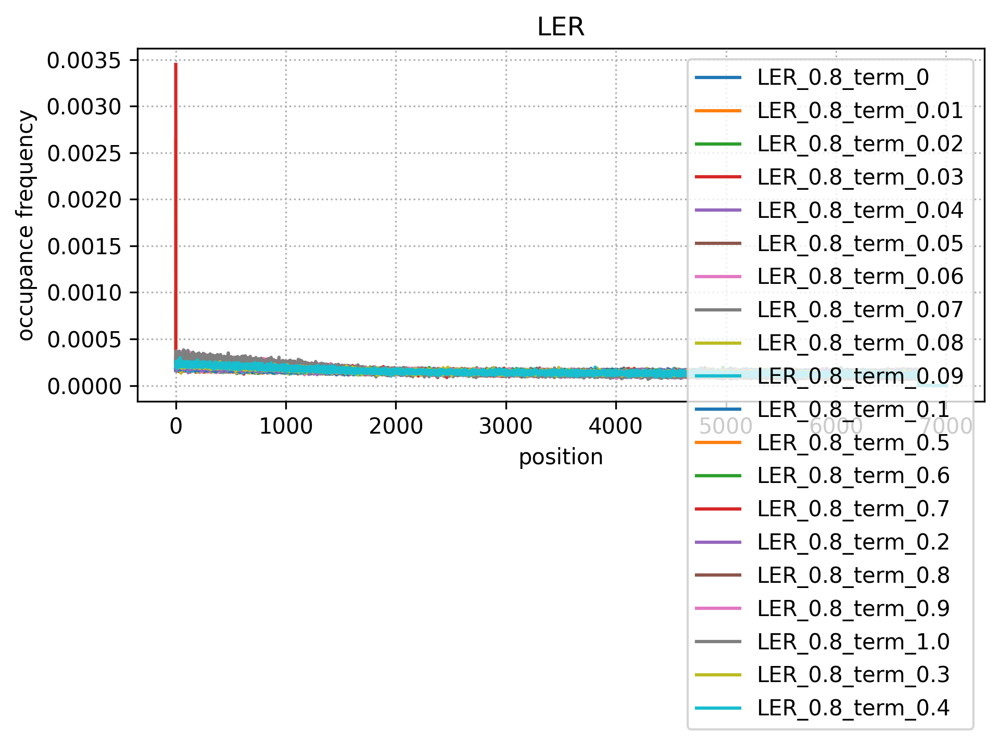

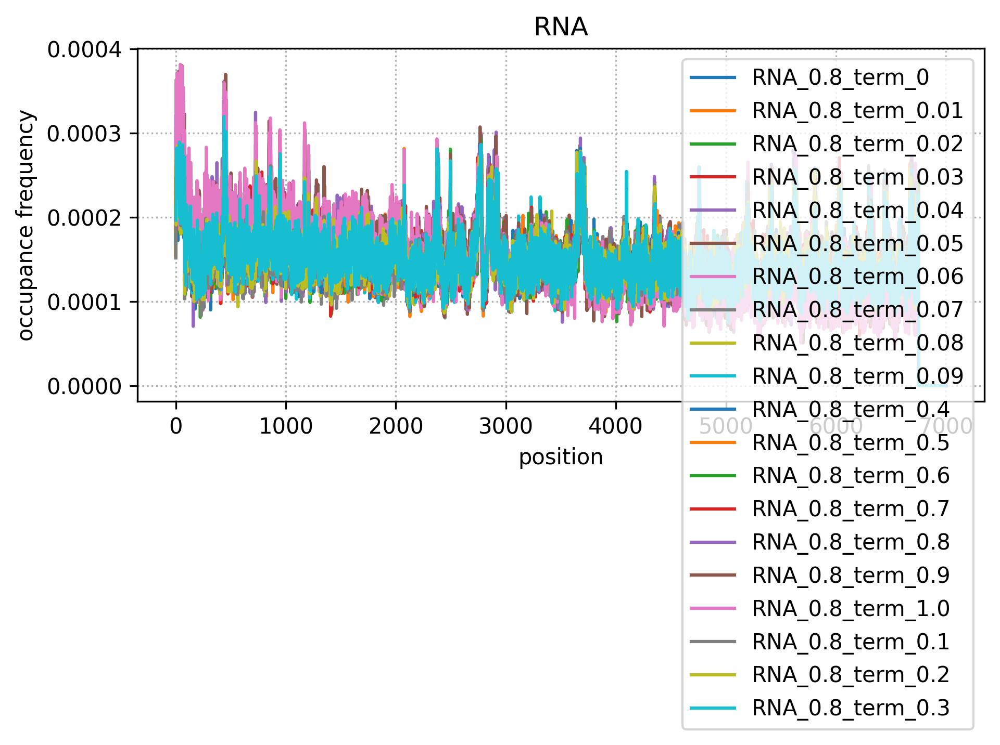

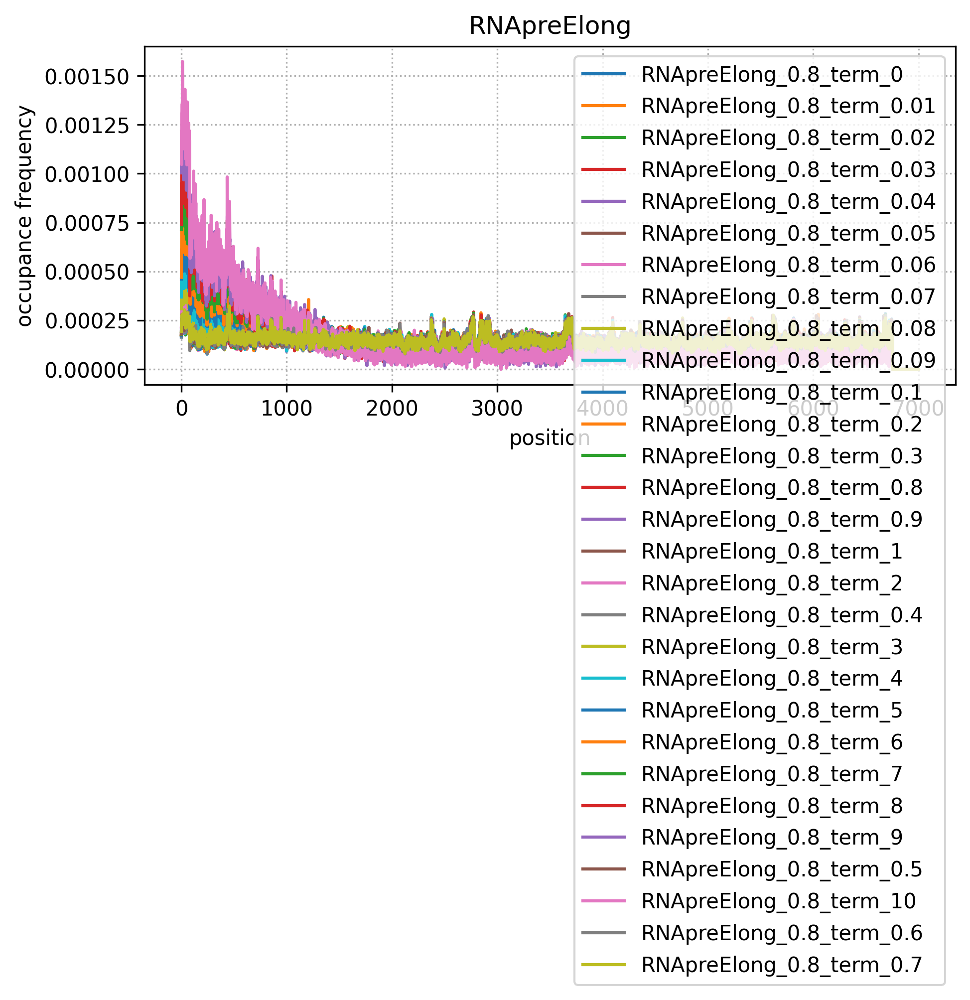

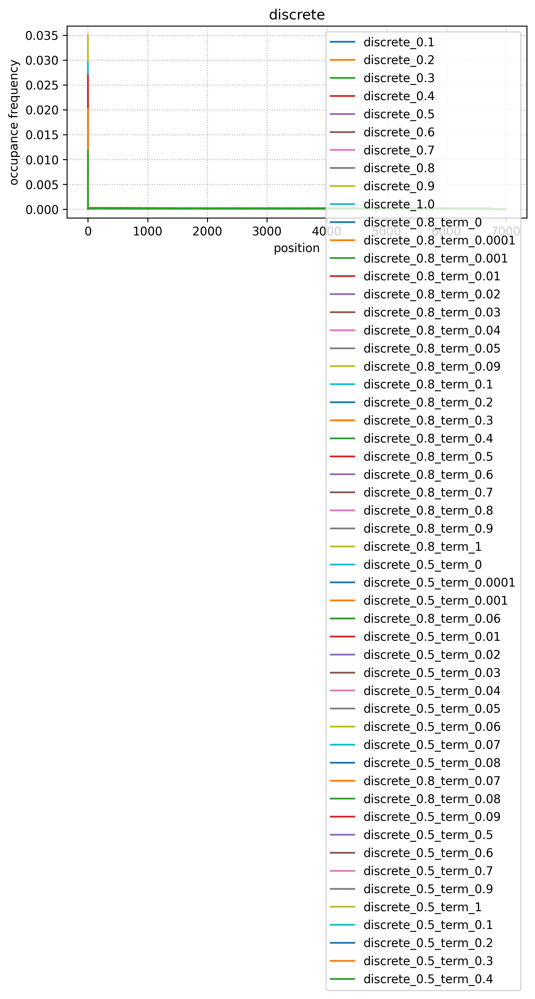

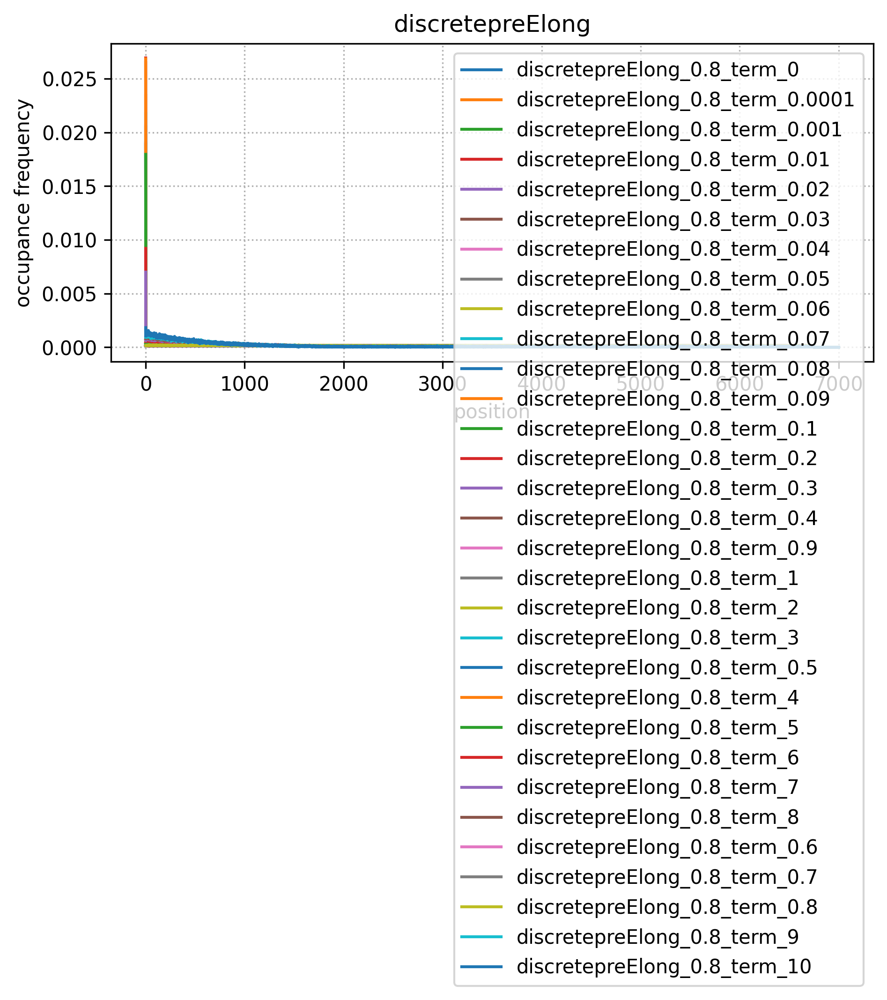

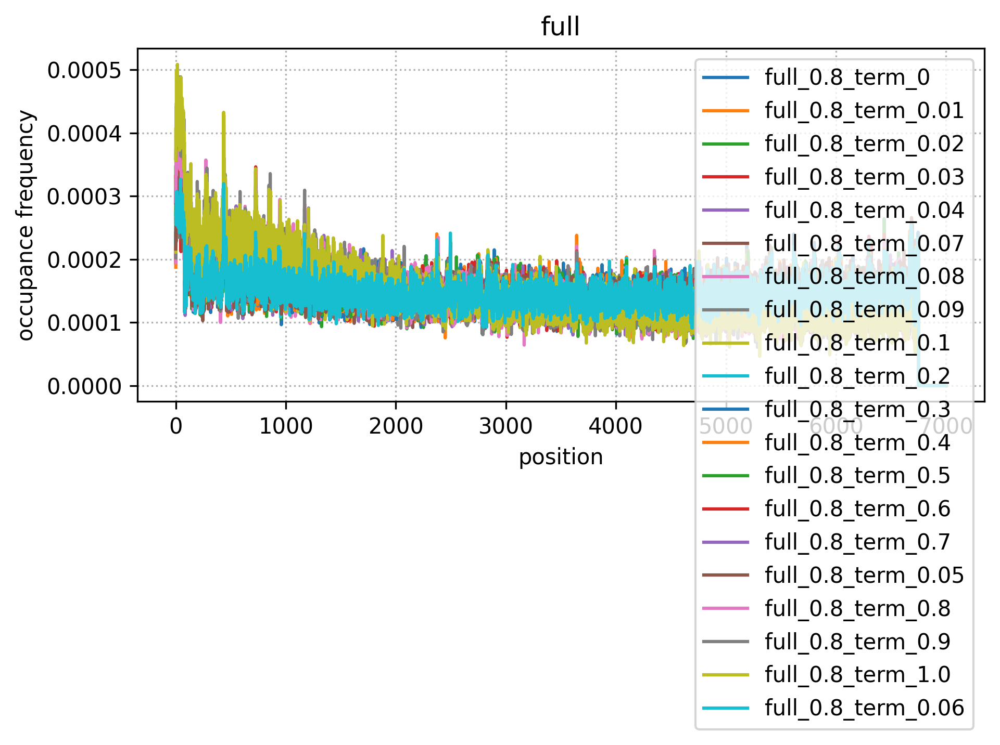

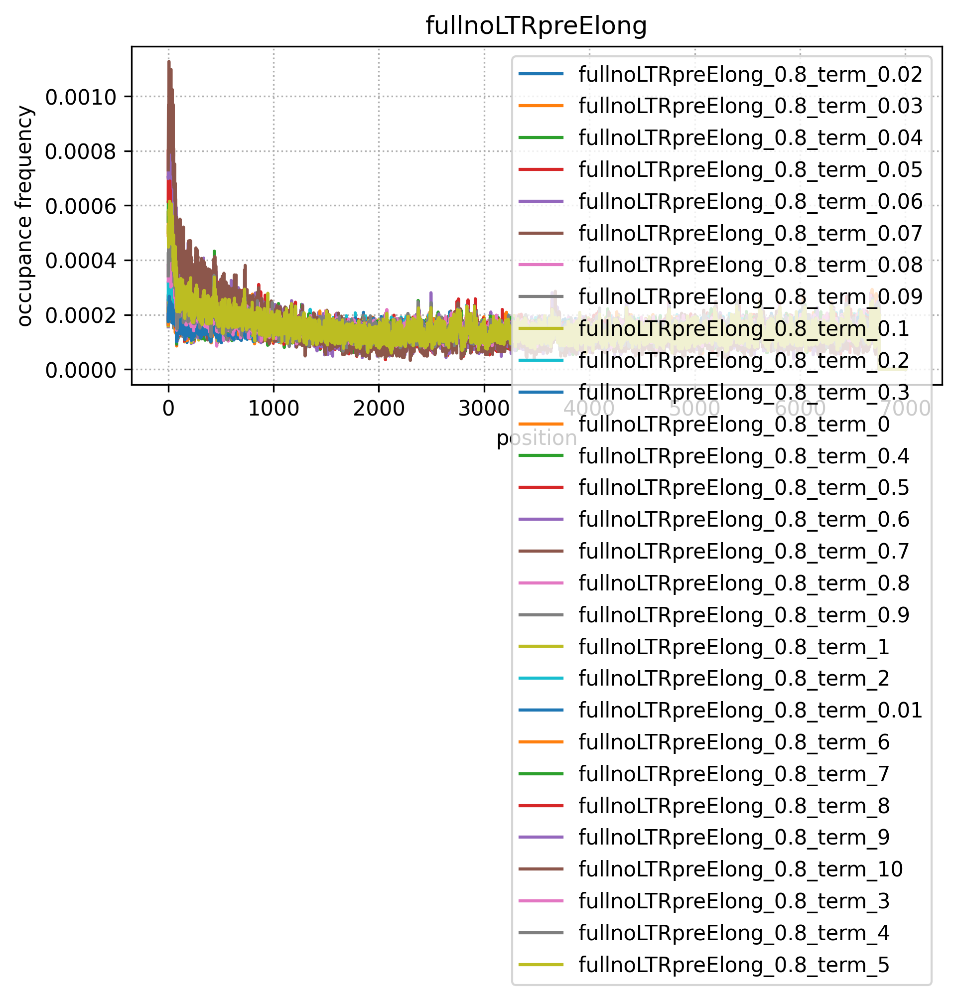

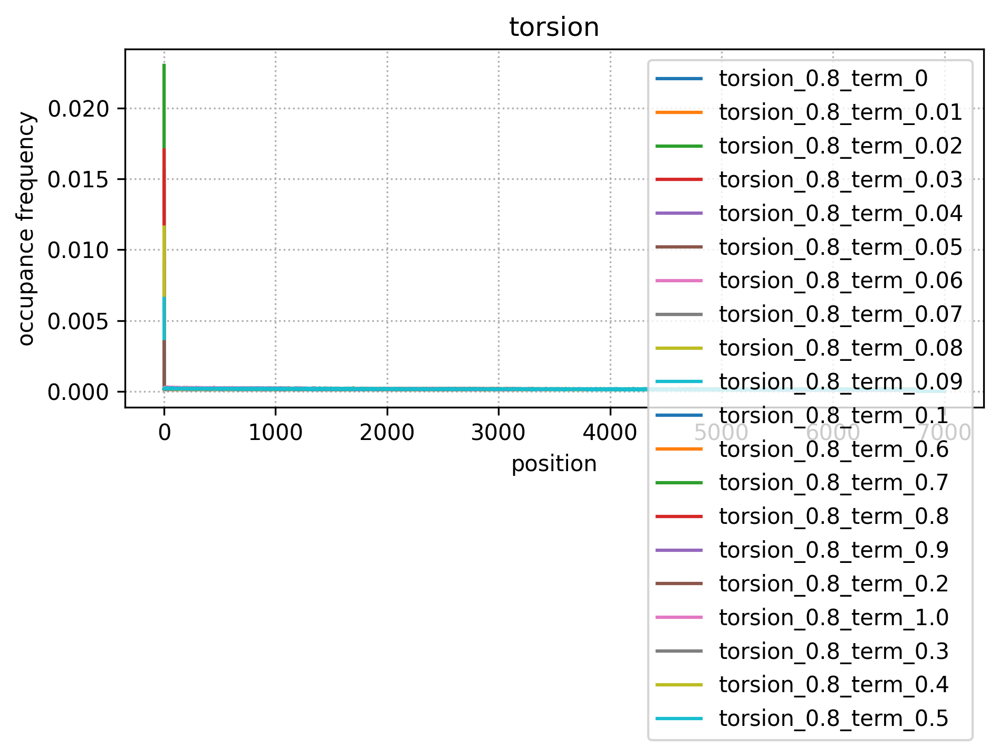

In [10]:
figsize=(7,3)
data = df00_output.T

for group, df_temp in data.groupby('modelType'):
    fig = plt.figure(figsize=figsize, dpi=300)
    ax1 = fig.add_subplot()
    a = df01_plots.index.tolist()
    
    for i in df_temp.index:       
        b = df01_plots[i].tolist()
        ax1.plot(a ,b ,label=i)

    ax1.legend()
    ax1.grid(True,ls="dotted")
    ax1.set_xlabel('position')
    ax1.set_ylabel('occupance frequency')
    plt.title(group)
    plt.show()

In [11]:
import plotly.graph_objects as go

# Create figure
fig = go.Figure()

for group, df_temp in data.groupby('modelType'):
    a = df_temp['nParticles'].tolist()
    b = df_temp['xEnd'].tolist()
    names = df_temp.index.tolist()

    fig.add_trace(
        go.Scatter(x=a, y=b,text=names))

fig.update_traces(
    hoverinfo="name+x+text",
    line={"width": 0.5},
    marker={"size": 8},
    mode="markers",
    showlegend=False
)

fig.update_layout(template="plotly_white")

fig.show()

In [12]:
import plotly.express as px
fig = px.scatter(data, x="nParticles", y="xEnd", color="modelType", symbol="modelType")
fig.update_layout(template="plotly_white")
fig.add_shape( # add a horizontal "target" line
    type="line", line_color="salmon", line_width=3, opacity=1, line_dash="dot",
    x0=0, x1=1, y0=200000, y1=200000, yref="y"
)
# fig.add_shape( # add a horizontal "target" line
#     type="line", line_color="green", line_width=3, opacity=1, line_dash="dot",
#     x0=50, x1=50, y0=0, y1=1
# )
# fig.add_shape(type="line",x0=1, y0=0, x1=1, y1=2,
#     line=dict(color="RoyalBlue",width=3)
# )
# fig.add_shape(type="line",
#     x0=2, y0=2, x1=5, y1=2,
#     line=dict(
#         color="LightSeaGreen",
#         width=4,
#         dash="dashdot"))
fig.show()

In [13]:
fig = px.scatter(data, x="tTaken", y="xEnd", color="modelType", symbol="modelType")
fig.update_layout(template="plotly_white")
fig.add_shape( # add a horizontal "target" line
    type="line", line_color="salmon", line_width=3, opacity=1, line_dash="dot",
    x0=0, x1=1, y0=200000, y1=200000, yref="y"
)
# fig.add_shape( # add a horizontal "target" line
#     type="line", line_color="green", line_width=3, opacity=1, line_dash="dot",
#     x0=50, x1=50, y0=0, y1=1
# )
# fig.add_shape(type="line",x0=1, y0=0, x1=1, y1=2,
#     line=dict(color="RoyalBlue",width=3)
# )
# fig.add_shape(type="line",
#     x0=2, y0=2, x1=5, y1=2,
#     line=dict(
#         color="LightSeaGreen",
#         width=4,
#         dash="dashdot"))
fig.show()

# Figures

## stochastic model and implementation of PT

In [14]:
d = data[(data['modelType']=='discrete') & (data['preTermDist']!=0) & (data['addProb']==0.8)].sort_values('preTermProb',ascending=False)
d

,time,c,dist,v5end,addProb,vInt,preTermProb,preTermDist,nParticles,xEnd,xEndPremature,tTaken,processivity,modelType
discrete_0.8_term_1,6000.0,0.0,0.0,0.0,0.8,50.0,1.0,6750.0,42.409875,70982.8125,140765.625,147.275204,0.335222,discrete
discrete_0.8_term_0.9,6000.0,0.0,0.0,0.0,0.8,50.0,0.9,6750.0,44.162125,78482.8125,132131.25,147.32111,0.372638,discrete
discrete_0.8_term_0.8,6000.0,0.0,0.0,0.0,0.8,50.0,0.8,6750.0,46.893687,88856.25,123731.25,147.397562,0.417975,discrete
discrete_0.8_term_0.7,6000.0,0.0,0.0,0.0,0.8,50.0,0.7,6750.0,48.46175,97621.875,112115.625,147.441567,0.465448,discrete
discrete_0.8_term_0.6,6000.0,0.0,0.0,0.0,0.8,50.0,0.6,6750.0,51.057812,109209.375,101606.25,147.533603,0.518033,discrete
discrete_0.8_term_0.5,6000.0,0.0,0.0,0.0,0.8,50.0,0.5,6750.0,53.450187,121068.75,88978.125,147.621166,0.576389,discrete
discrete_0.8_term_0.4,6000.0,0.0,0.0,0.0,0.8,50.0,0.4,6750.0,55.977625,133776.5625,76209.375,147.697444,0.637074,discrete
discrete_0.8_term_0.3,6000.0,0.0,0.0,0.0,0.8,50.0,0.3,6750.0,59.410437,150192.1875,59775.0,147.831311,0.715313,discrete
discrete_0.8_term_0.2,6000.0,0.0,0.0,0.0,0.8,50.0,0.2,6750.0,62.658187,168145.3125,41915.625,147.942401,0.80046,discrete
discrete_0.8_term_0.1,6000.0,0.0,0.0,0.0,0.8,50.0,0.1,6750.0,66.679875,187776.5625,21590.625,148.095688,0.896877,discrete


In [15]:
# from adjustText import adjust_text

# figsize=(5,3)
# dpi=300

# fig = plt.figure(figsize=figsize, dpi=dpi)
# ax1 = fig.add_subplot()

# x = d['nParticles'].tolist()
# y = d['xEnd'].tolist()

# ax1.scatter(x ,y,color='darkblue')

# #points labels
# texts=[]
# s = [str(i) for i in d['preTermProb'].tolist()]
# for t in zip(x,y,s):
#     texts.append(ax1.text(t[0],t[1],t[2]))

# ax1.axvspan(40,60,color='green',alpha=0.1)
# ax1.axhspan(150000,250000,color='green',alpha=0.1)

# # fit regression line
# z = np.polyfit(x, y, deg=2)
# p2 = np.poly1d(z)

# # Plot regression line
# xseq = np.linspace(0, 90, num=100)
# ax1.plot(xseq, p2(xseq), "--", color="k", lw=2.5, alpha=0.5);
    
# ax1.set_xlim(40,75)
# ax1.set_ylim(50000,250000)

# ax1.grid(True,ls="dotted")
# ax1.set_xlabel('RNAPI per rDNA')
# ax1.set_ylabel('Ribosome production')
# plt.title('Effect of premature termination '+'$\it{PT}$'+' on ribosome production')
# adjust_text(texts, only_move={'points':'y', 'texts':'y'}, arrowprops=dict(arrowstyle="->", color='black', lw=0.5))
# plt.savefig(fname="Fig_M_Aalt1.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

           2
7.831e+04 x - 2.146e+05 x + 2.086e+05


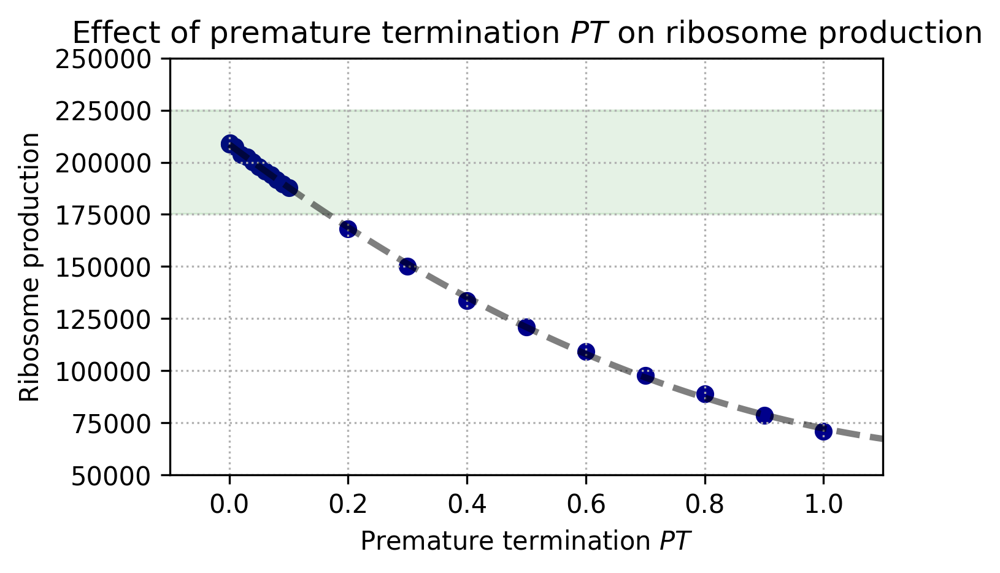

In [16]:
figsize=(5,3)
dpi=300

fig = plt.figure(figsize=figsize, dpi=dpi)
ax1 = fig.add_subplot()

x = d['preTermProb'].tolist()
y = d['xEnd'].tolist()

ax1.scatter(x ,y,color='darkblue')

# fit regression line
z = np.polyfit(x, y, deg=2)
p2 = np.poly1d(z)
print(p2)

# Plot regression line
xseq = np.linspace(0, 1.1, num=100)
ax1.plot(xseq, p2(xseq), "--", color="k", lw=2.5, alpha=0.5)

ax1.set_xlim(-0.1,1.1)
ax1.set_ylim(50000,250000)

ax1.axhspan(175000,225000,color='green',alpha=0.1)

ax1.grid(True,ls="dotted")
ax1.set_xlabel('Premature termination '+'$\it{PT}$')
ax1.set_ylabel('Ribosome production')
plt.title('Effect of premature termination '+'$\it{PT}$'+' on ribosome production')
plt.savefig(fname="Fig_model_A.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

In [17]:
# figsize=(5,3)
# dpi=300

# fig = plt.figure(figsize=figsize, dpi=dpi)
# fig.suptitle('Effect of premature termination '+'$\it{PT}$'+' on processivity')

# ax1 = fig.add_subplot(1,2,1)

# x = d['preTermProb'].tolist()
# y = d['processivity'].tolist()

# ax1.scatter(x ,y,color='darkblue')
    
# # ax1.set_ylim(0.8,1.05)
# ax1.set_ylim(0,1.1)
# ax1.set_xlim(-0.01,0.1)

# ax1.grid(True,ls="dotted")
# ax1.set_xlabel('Premature termination '+'$\it{PT}$')
# ax1.set_ylabel('Processivity')

# ax1.spines['right'].set_visible(False)

# ax2 = fig.add_subplot(1,2,2)

# x = d['preTermProb'].tolist()
# y = d['processivity'].tolist()

# ax2.scatter(x ,y,color='darkblue')
    
# ax2.set_ylim(0,1.1)
# ax2.set_xlim(0.1,1.12)

# ax2.grid(True,ls="dotted")
# # ax2.set_xlabel('Premature termination '+'$\it{PT}$')
# ax2.spines['left'].set_visible(False)

# ax1.yaxis.tick_left()
# ax2.yaxis.tick_right()

# # Make the spacing between the two axes a bit smaller
# plt.subplots_adjust(wspace=0.03)


# plt.savefig(fname="Fig_M_A.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

In [18]:
d = data[(data['modelType']=='discrete') & (data['preTermProb']==0) & (data['preTermDist']==0)]
d

,time,c,dist,v5end,addProb,vInt,preTermProb,preTermDist,nParticles,xEnd,xEndPremature,tTaken,processivity,modelType
discrete_0.1,6000.0,0.0,0.0,0.0,0.1,50.0,0.0,0.0,13.39075,40673.4375,0.0,146.475871,1.0,discrete
discrete_0.2,6000.0,0.0,0.0,0.0,0.2,50.0,0.0,0.0,24.8595,75304.6875,0.0,146.717822,1.0,discrete
discrete_0.3,6000.0,0.0,0.0,0.0,0.3,50.0,0.0,0.0,34.819437,105323.4375,0.0,146.961995,1.0,discrete
discrete_0.4,6000.0,0.0,0.0,0.0,0.4,50.0,0.0,0.0,43.351312,130875.0,0.0,147.235247,1.0,discrete
discrete_0.5,6000.0,0.0,0.0,0.0,0.5,50.0,0.0,0.0,51.289812,154696.875,0.0,147.487927,1.0,discrete
discrete_0.6,6000.0,0.0,0.0,0.0,0.6,50.0,0.0,0.0,57.8215,174056.25,0.0,147.704663,1.0,discrete
discrete_0.7,6000.0,0.0,0.0,0.0,0.7,50.0,0.0,0.0,64.600625,193204.6875,0.0,147.987779,1.0,discrete
discrete_0.8,6000.0,0.0,0.0,0.0,0.8,50.0,0.0,0.0,71.213625,208654.6875,0.0,148.233244,1.0,discrete
discrete_0.9,6000.0,0.0,0.0,0.0,0.9,50.0,0.0,0.0,77.282312,223073.4375,0.0,148.523856,1.0,discrete
discrete_1.0,6000.0,0.0,0.0,0.0,1.0,50.0,0.0,0.0,81.566938,236517.1875,0.0,148.772313,1.0,discrete


            2
-1.441e+05 x + 3.742e+05 x + 3550


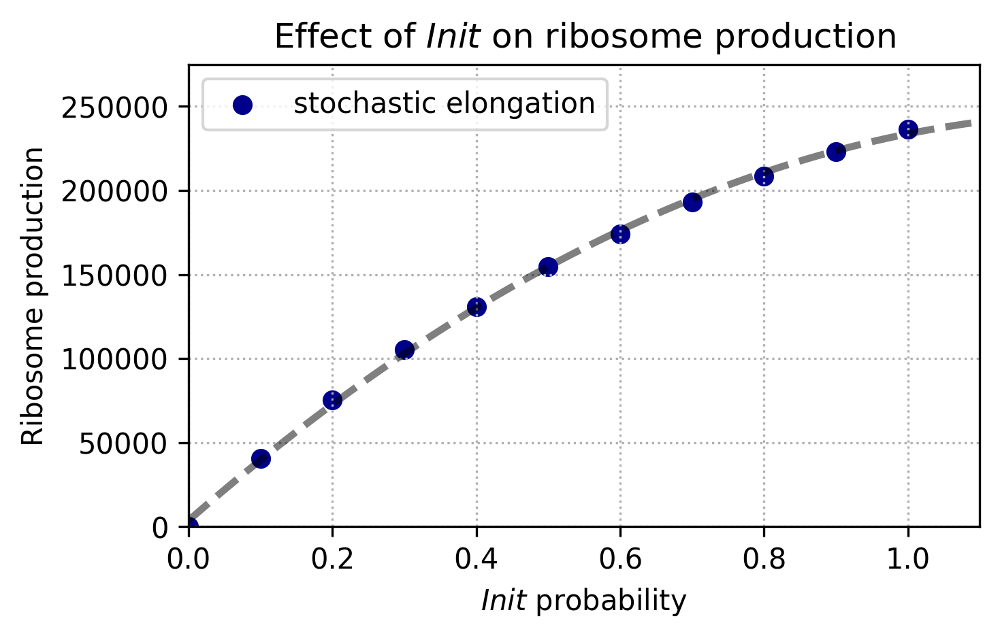

In [19]:
figsize=(5,3)
dpi=300

fig = plt.figure(figsize=figsize, dpi=dpi)
ax1 = fig.add_subplot()

x = [0]+d['addProb'].tolist()
y = [0]+d['xEnd'].tolist()

ax1.scatter(x ,y, color='darkblue',label='stochastic elongation')

# fit regression line
z = np.polyfit(x, y, deg=2)
p2 = np.poly1d(z)
print(p2)

# Plot regression line
xseq = np.linspace(0, 1.1, num=100)
ax1.plot(xseq, p2(xseq), "--", color="k", lw=2.5, alpha=0.5)

# # fit regression line
# z = np.polyfit(x[:5], y[:5], deg=1)
# p2 = np.poly1d(z)
# print(p2)

# # Plot regression line
# xseq = np.linspace(0, 1.1, num=100)
# ax1.plot(xseq, p2(xseq), "-", color="k", lw=2.5, alpha=0.5)

ax1.set_xlim(0,1.1)
ax1.set_ylim(0,275000)

ax1.grid(True,ls="dotted")
ax1.set_xlabel('$\it{Init}$'+' probability')
ax1.set_ylabel('Ribosome production')
# ax1.set_ylabel('Ribosome production [100 min$^{-1}$]')

plt.legend()
plt.title('Effect of '+'$\it{Init}$'+' on ribosome production')
plt.savefig(fname="Fig_model_optional_1.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

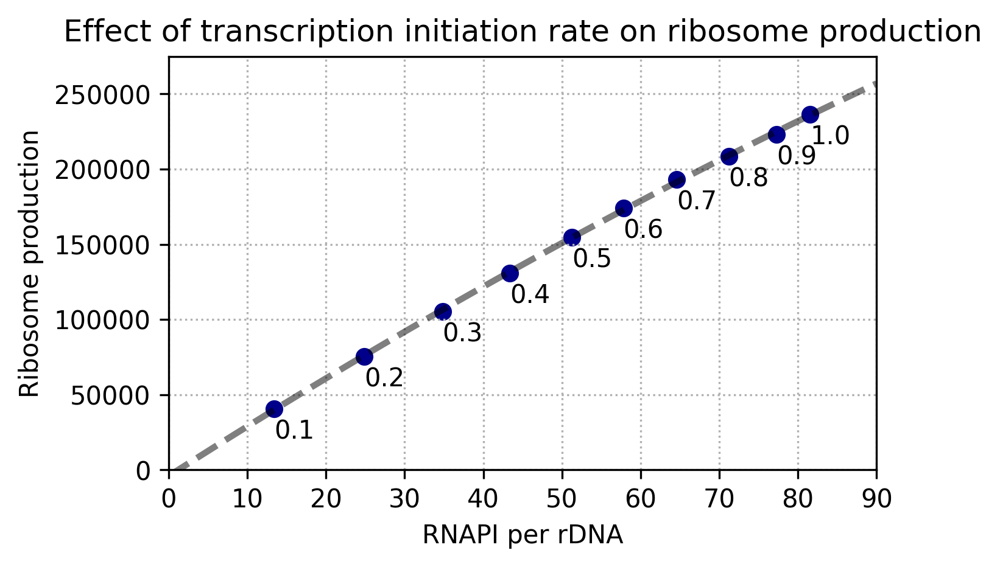

In [20]:
figsize=(5,3)
dpi=300

fig = plt.figure(figsize=figsize, dpi=dpi)
ax1 = fig.add_subplot()

x = d['nParticles'].tolist()
y = d['xEnd'].tolist()

ax1.scatter(x ,y, color='darkblue')

#points labels
s = [str(i) for i in d['addProb'].tolist()]
for t in zip(x,y,s):
    ax1.text(t[0],t[1]-20000,t[2])

# fit regression line
z = np.polyfit(x, y, deg=2)
p2 = np.poly1d(z)

# Plot regression line
xseq = np.linspace(0, 90, num=100)
ax1.plot(xseq, p2(xseq), "--", color="k", lw=2.5, alpha=0.5)
    
ax1.set_xlim(0,90)
ax1.set_ylim(0,275000)

ax1.grid(True,ls="dotted")
ax1.set_xlabel('RNAPI per rDNA')
ax1.set_ylabel('Ribosome production')
plt.title('Effect of transcription initiation rate on ribosome production')
plt.savefig(fname="Fig_model_optional_2.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

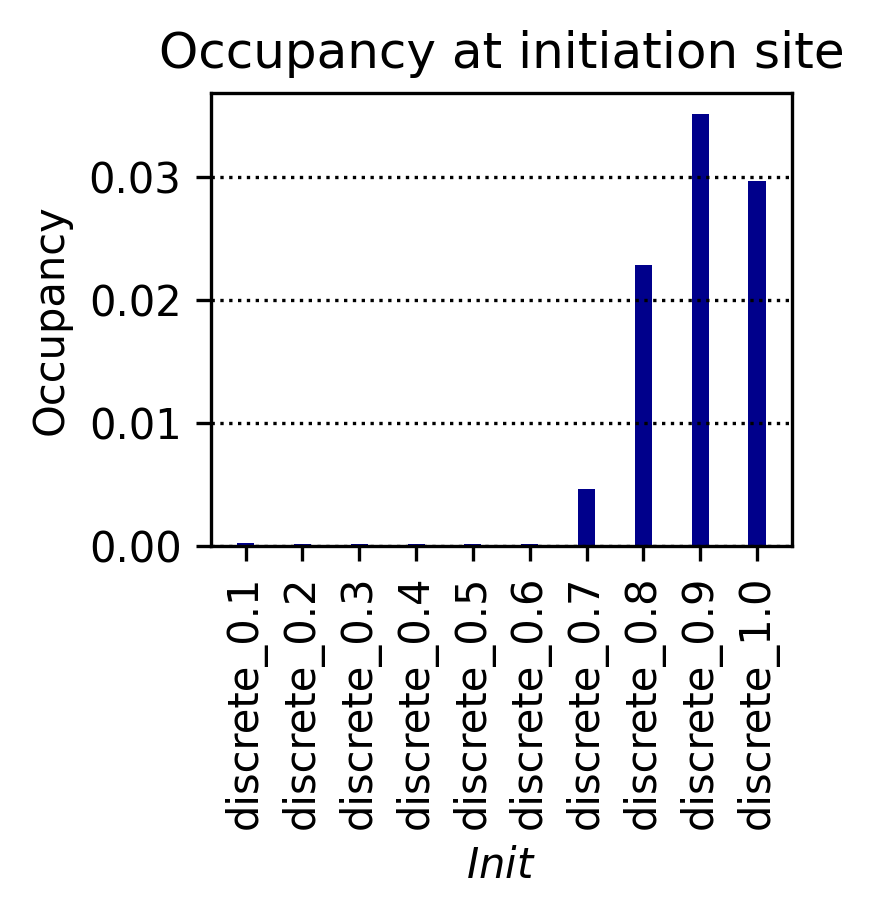

In [21]:
names = d.index.tolist()
peak_value = df01_plots[names].T[0].sort_index()

dpi=300

fig = plt.figure(figsize=(len(peak_value) / 4, 2), dpi=dpi)
ax1 = fig.add_subplot()

x = np.arange(len(peak_value))
width = 0.3

plt.title('Occupancy at initiation site')
ax1.bar(x, peak_value.tolist(), width, color='darkblue')
ax1.set_ylabel('Occupancy')
ax1.set_xlabel('$\it{Init}$')
ax1.grid(axis='y', c='black', ls="dotted")
plt.xticks(x, peak_value.index.tolist(), rotation=90)

plt.savefig(fname="Fig_model_optional_3.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

## 5' bias

In [22]:
d = data[(data['addProb']==0.8) & (data['preTermProb']==0) & (data['preTermDist']==6750)]
d

,time,c,dist,v5end,addProb,vInt,preTermProb,preTermDist,nParticles,xEnd,xEndPremature,tTaken,processivity,modelType
discrete_0.8_term_0,6000.0,0.0,0.0,0.0,0.8,50.0,0.0,6750.0,70.8165,208785.9375,0.0,148.260551,1.0,discrete
torsion_0.8_term_0,6000.0,500.0,0.0,0.0,0.8,50.0,0.0,6750.0,70.565625,210178.125,0.0,146.931055,1.0,torsion
LER_0.8_term_0,6000.0,500.0,2000.0,0.2,0.8,50.0,0.0,6750.0,64.507812,189117.1875,0.0,151.62325,1.0,LER
RNA_0.8_term_0,6000.0,0.0,0.0,0.0,0.8,50.0,0.0,6750.0,51.525437,200339.0625,0.0,114.656606,1.0,RNA
full_0.8_term_0,6000.0,500.0,2000.0,0.2,0.8,50.0,0.0,6750.0,47.412,176315.625,0.0,119.829423,1.0,full


In [23]:
colorType = {
    'discrete' : 'darkblue',
    'torsion'  : 'red',
    'LER'      : '#E75480',
    'RNA'      : 'orange',
    'full'     : 'grey'
}

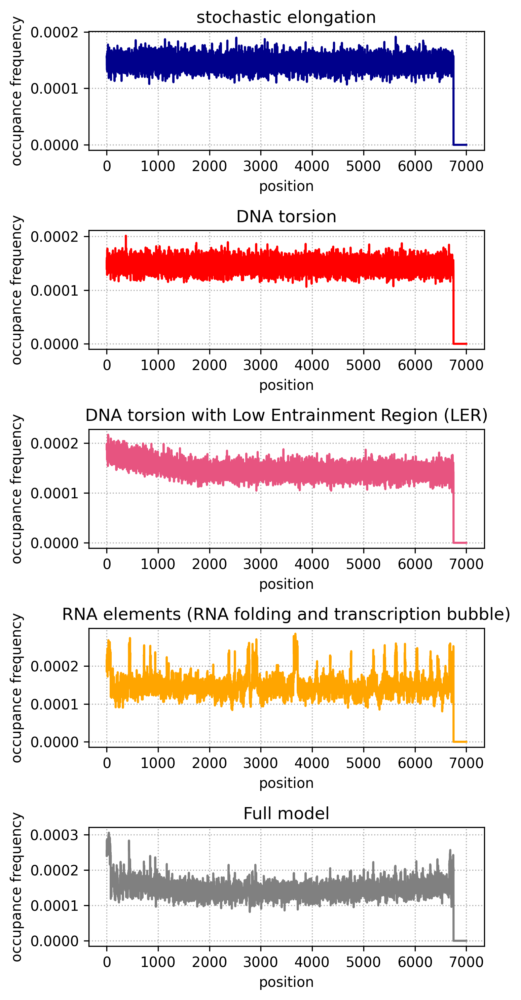

In [24]:
figsize=(5,10)
data = df00_output.T

naming = {'discrete' : 'stochastic elongation',
          'torsion'  : 'DNA torsion',
          'LER'      : 'DNA torsion with Low Entrainment Region (LER)',
          'RNA'      : 'RNA elements (RNA folding and transcription bubble)',
          'full'     : 'Full model'}

fig = plt.figure(figsize=figsize, dpi=300)
for i,name in enumerate(d.index):
    ax1 = fig.add_subplot(5,1,i+1)
    
    a = df01_plots.index.tolist()
    b = df01_plots[name].tolist()
    b = [np.nan]+b[1:] #removing the 5' peak
    ax1.plot(a ,b ,label=name, c=colorType[d['modelType'][name]])

#     ax1.legend()
    ax1.grid(True,ls="dotted")
    ax1.set_xlabel('position')
    ax1.set_ylabel('occupance frequency')
    plt.title(naming[name.split('_')[0]])
plt.tight_layout()
plt.savefig(fname="Fig_model_SA.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

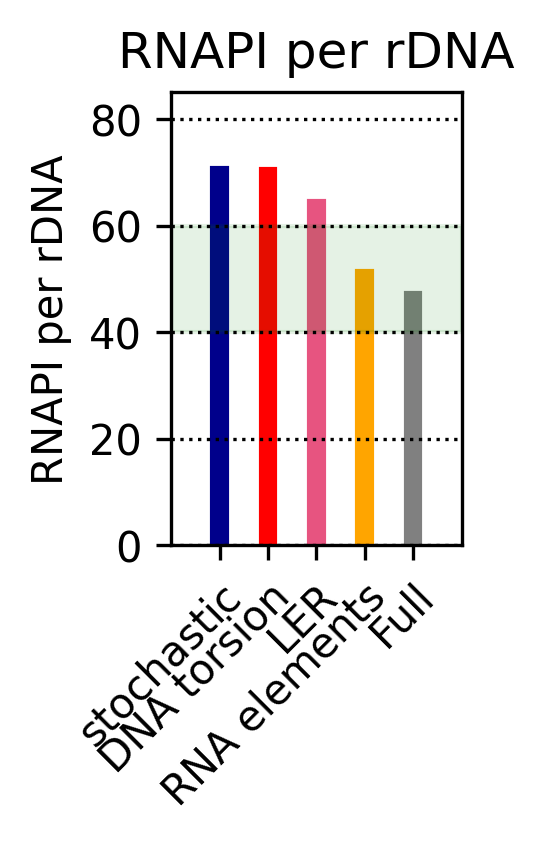

In [25]:
names = d.index.tolist()
peak_value = d['nParticles']

n = ['stochastic','DNA torsion','LER','RNA elements','Full']

dpi=300

fig = plt.figure(figsize=(len(peak_value) / 4, 2), dpi=dpi)
ax1 = fig.add_subplot()

x = np.arange(len(peak_value))
width = 0.3

plt.title('RNAPI per rDNA')
barlist = ax1.bar(x, peak_value.tolist(), width)
for i,name in enumerate(names):
    barlist[i].set_color(colorType[d.loc[name]['modelType']])
ax1.set_ylabel('RNAPI per rDNA')
# ax1.set_xlabel('$\it{Init}$')
ax1.axhspan(40,60,color='green',alpha=0.1)
ax1.grid(axis='y', c='black', ls="dotted")
plt.xticks(x, n, rotation=45,ha="right",rotation_mode='anchor')
plt.margins(0.2)
plt.savefig(fname="Fig_model_SB.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

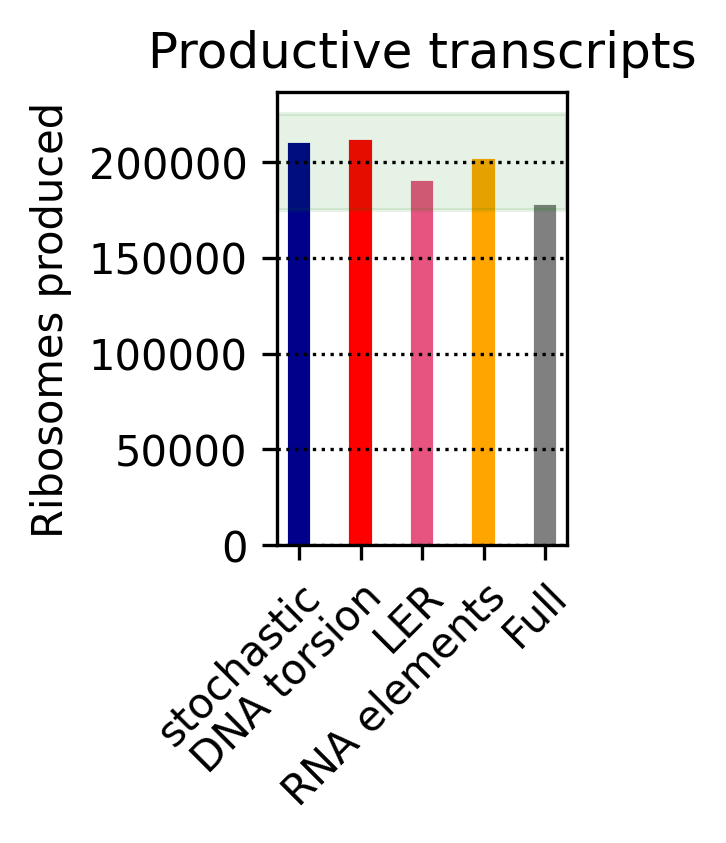

In [26]:
names = d.index.tolist()
peak_value = d['xEnd']

dpi=300

fig = plt.figure(figsize=(len(peak_value) / 4, 2), dpi=dpi)
ax1 = fig.add_subplot()

x = np.arange(len(peak_value))
width = 0.3

plt.title('Productive transcripts')
barlist = ax1.bar(x, peak_value.tolist(), width)
for i,name in enumerate(names):
    barlist[i].set_color(colorType[d.loc[name]['modelType']])
ax1.set_ylabel('Ribosomes produced')
# ax1.set_xlabel('$\it{Init}$')
ax1.axhspan(175000,225000,color='green',alpha=0.1)
ax1.grid(axis='y', c='black', ls="dotted")
plt.xticks(x, n, rotation=45,ha="right",rotation_mode='anchor')

plt.savefig(fname="Fig_model_SC.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

In [27]:
df00_output.T['modelType'].unique()

array(['discrete', 'discretepreElong', 'torsion', 'LER', 'RNA',
       'RNApreElong', 'full', 'fullnoLTRpreElong'], dtype=object)

In [28]:
d = data[(data['modelType']=='discretepreElong')].sort_values("preTermProb",ascending=False)
# d['preTermProb'] = d['preTermProb'] * (2000/7000)
d

,time,c,dist,v5end,addProb,vInt,preTermProb,preTermDist,nParticles,xEnd,xEndPremature,tTaken,processivity,modelType
discretepreElong_0.8_term_10,6000.0,0.0,0.0,0.0,0.8,50.0,10.0,2000.0,8.118187,8334.375,208012.5,146.261796,0.038523,discretepreElong
discretepreElong_0.8_term_9,6000.0,0.0,0.0,0.0,0.8,50.0,9.0,2000.0,9.537125,11742.1875,204909.375,146.315889,0.054198,discretepreElong
discretepreElong_0.8_term_8,6000.0,0.0,0.0,0.0,0.8,50.0,8.0,2000.0,11.074937,15768.75,199800.0,146.406845,0.07315,discretepreElong
discretepreElong_0.8_term_7,6000.0,0.0,0.0,0.0,0.8,50.0,7.0,2000.0,13.30675,21792.1875,193457.8125,146.487921,0.101241,discretepreElong
discretepreElong_0.8_term_6,6000.0,0.0,0.0,0.0,0.8,50.0,6.0,2000.0,16.267375,30520.3125,184307.8125,146.486013,0.142069,discretepreElong
discretepreElong_0.8_term_5,6000.0,0.0,0.0,0.0,0.8,50.0,5.0,2000.0,19.95375,41578.125,172387.5,146.648865,0.194322,discretepreElong
discretepreElong_0.8_term_4,6000.0,0.0,0.0,0.0,0.8,50.0,4.0,2000.0,25.059937,58003.125,155948.4375,146.754034,0.271104,discretepreElong
discretepreElong_0.8_term_3,6000.0,0.0,0.0,0.0,0.8,50.0,3.0,2000.0,31.645812,79148.4375,133856.25,146.937462,0.371581,discretepreElong
discretepreElong_0.8_term_2,6000.0,0.0,0.0,0.0,0.8,50.0,2.0,2000.0,40.8325,109814.0625,102473.4375,147.200591,0.517289,discretepreElong
discretepreElong_0.8_term_1,6000.0,0.0,0.0,0.0,0.8,50.0,1.0,2000.0,52.982437,151415.625,59048.4375,147.587763,0.719437,discretepreElong


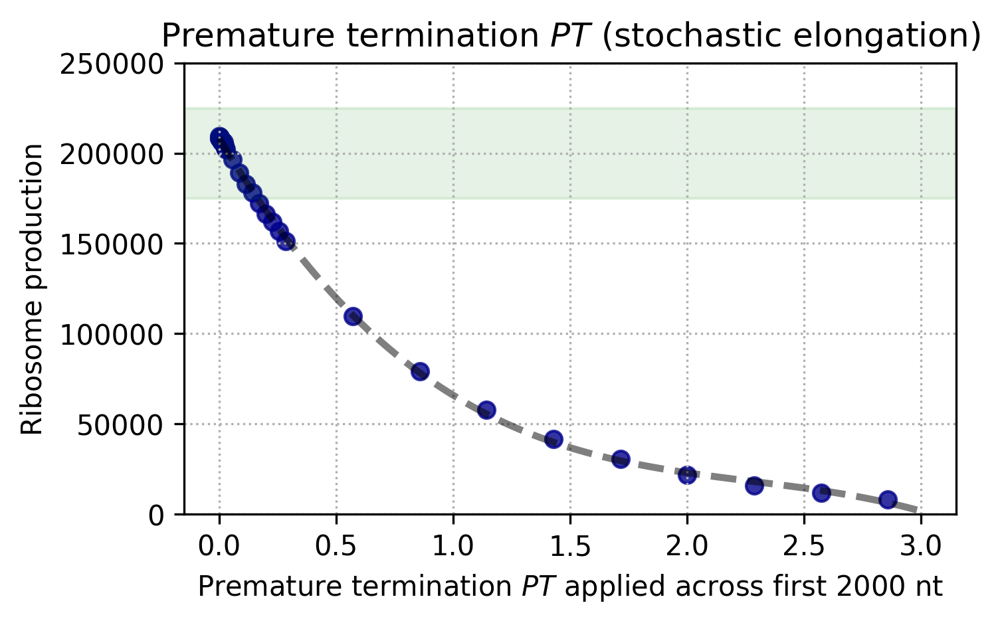

In [29]:
figsize=(5,3)
dpi=300

fig = plt.figure(figsize=figsize, dpi=dpi)
ax1 = fig.add_subplot()

x = d['preTermProb'].multiply(2.0/7.0).tolist()
y = d['xEnd'].tolist()

ax1.scatter(x ,y, color='darkblue',alpha=0.8)

# #points labels
# s = [str(i) for i in d['preTermProb'].tolist()]
# for t in zip(x,y,s):
#     ax1.text(t[0],t[1]-20000,t[2])

# fit regression line
z = np.polyfit(x, y, deg=3)
p2 = np.poly1d(z)

# Plot regression line
xseq = np.linspace(0, 3, num=100)
ax1.plot(xseq, p2(xseq), "--", color="k", lw=2.5, alpha=0.5)
    
# ax1.set_xlim(0,1)
ax1.set_ylim(0,250000)

# ax1.axvspan(40,60,color='green',alpha=0.1)
ax1.axhspan(175000,225000,color='green',alpha=0.1)

ax1.grid(True,ls="dotted")
ax1.set_xlabel('Premature termination '+'$\it{PT}$'+' applied across first 2000 nt')
ax1.set_ylabel('Ribosome production')
plt.title('Premature termination '+'$\it{PT}$'+' (stochastic elongation)')
plt.savefig(fname="Fig_model_SD.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

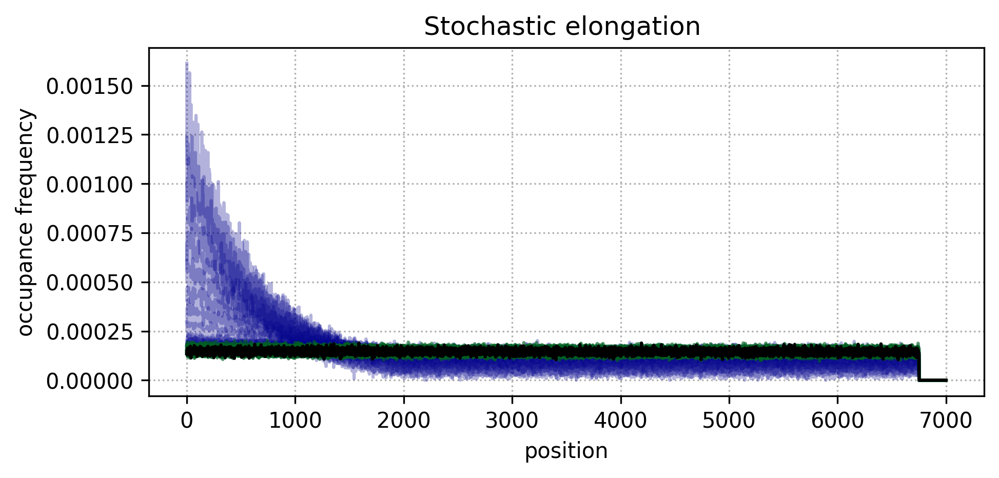

In [30]:
figsize=(7,3)

fig = plt.figure(figsize=figsize, dpi=300)
ax1 = fig.add_subplot()
a = df01_plots.index.tolist()

for i in d.index:
    b = df01_plots[i].tolist()
    b = [np.nan]+b[1:]
    ax1.plot(a ,b ,label=i, c='darkblue',alpha=0.3)
    if d.loc[i]['preTermProb'] < 0.5:
        ax1.plot(a ,b ,label=i, c='green',alpha=0.5)
    if d.loc[i]['preTermProb'] == 0.0:
        ax1.plot(a ,b ,label=i, c='black')

# ax1.legend()
ax1.grid(True,ls="dotted")
ax1.set_xlabel('position')
ax1.set_ylabel('occupance frequency')
plt.title('Stochastic elongation ')
plt.savefig(fname="Fig_model_SE.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

In [31]:
d = data[(data['modelType']=='RNApreElong')].sort_values("preTermProb",ascending=False)
d

,time,c,dist,v5end,addProb,vInt,preTermProb,preTermDist,nParticles,xEnd,xEndPremature,tTaken,processivity,modelType
RNApreElong_0.8_term_10,6000.0,0.0,0.0,0.0,0.8,50.0,10.0,2000.0,8.594375,16425.0,188128.125,113.844912,0.080297,RNApreElong
RNApreElong_0.8_term_9,6000.0,0.0,0.0,0.0,0.8,50.0,9.0,2000.0,9.861062,20840.625,183543.75,113.885936,0.101968,RNApreElong
RNApreElong_0.8_term_8,6000.0,0.0,0.0,0.0,0.8,50.0,8.0,2000.0,11.4285,26685.9375,178795.3125,113.93868,0.12987,RNApreElong
RNApreElong_0.8_term_7,6000.0,0.0,0.0,0.0,0.8,50.0,7.0,2000.0,13.37275,34195.3125,170259.375,113.930346,0.167251,RNApreElong
RNApreElong_0.8_term_6,6000.0,0.0,0.0,0.0,0.8,50.0,6.0,2000.0,15.79275,43898.4375,159684.375,113.991623,0.215629,RNApreElong
RNApreElong_0.8_term_5,6000.0,0.0,0.0,0.0,0.8,50.0,5.0,2000.0,18.931687,56700.0,147215.625,114.042847,0.278056,RNApreElong
RNApreElong_0.8_term_4,6000.0,0.0,0.0,0.0,0.8,50.0,4.0,2000.0,22.515562,71882.8125,129984.375,114.087552,0.35609,RNApreElong
RNApreElong_0.8_term_3,6000.0,0.0,0.0,0.0,0.8,50.0,3.0,2000.0,27.682062,94214.0625,108196.875,114.18483,0.465459,RNApreElong
RNApreElong_0.8_term_2,6000.0,0.0,0.0,0.0,0.8,50.0,2.0,2000.0,33.778312,121012.5,79715.625,114.291681,0.602868,RNApreElong
RNApreElong_0.8_term_1,6000.0,0.0,0.0,0.0,0.8,50.0,1.0,2000.0,41.368125,154757.8125,45121.875,114.454908,0.774255,RNApreElong


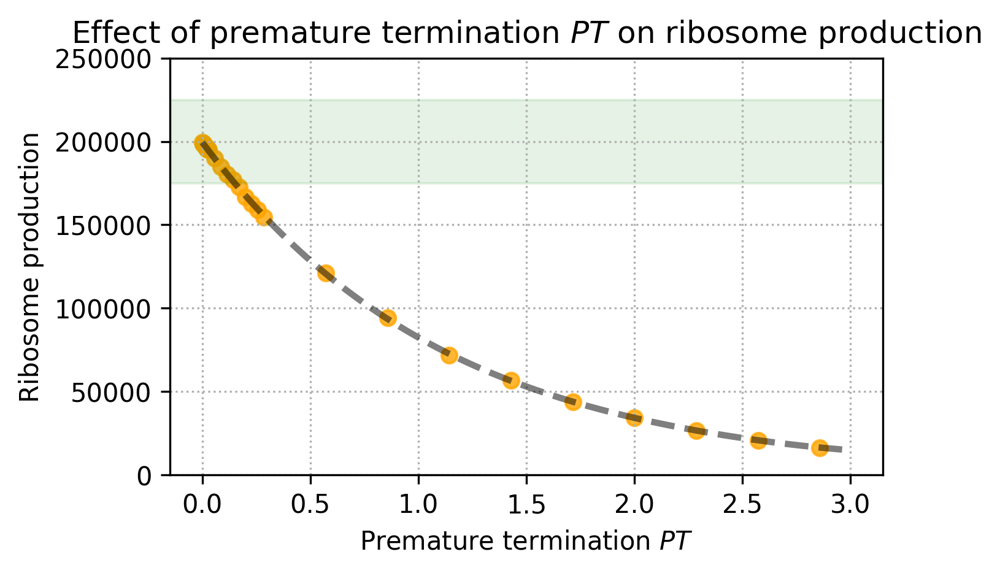

In [32]:
figsize=(5,3)
dpi=300

fig = plt.figure(figsize=figsize, dpi=dpi)
ax1 = fig.add_subplot()

x = d['preTermProb'].multiply(2.0/7.0).tolist()
y = d['xEnd'].tolist()

ax1.scatter(x ,y, color='orange',alpha=0.8)

# #points labels
# s = [str(i) for i in d['preTermProb'].tolist()]
# for t in zip(x,y,s):
#     ax1.text(t[0],t[1]-20000,t[2])

# fit regression line
z = np.polyfit(x, y, deg=4)
p2 = np.poly1d(z)

# Plot regression line
xseq = np.linspace(0, 3, num=100)
ax1.plot(xseq, p2(xseq), "--", color="k", lw=2.5, alpha=0.5)
    
# ax1.set_xlim(0,1)
ax1.set_ylim(0,250000)

# ax1.axvspan(40,60,color='green',alpha=0.1)
ax1.axhspan(175000,225000,color='green',alpha=0.1)

ax1.grid(True,ls="dotted")
ax1.set_xlabel('Premature termination '+'$\it{PT}$')
ax1.set_ylabel('Ribosome production')
plt.title('Effect of premature termination '+'$\it{PT}$'+' on ribosome production')
plt.savefig(fname="Fig_model_SF.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

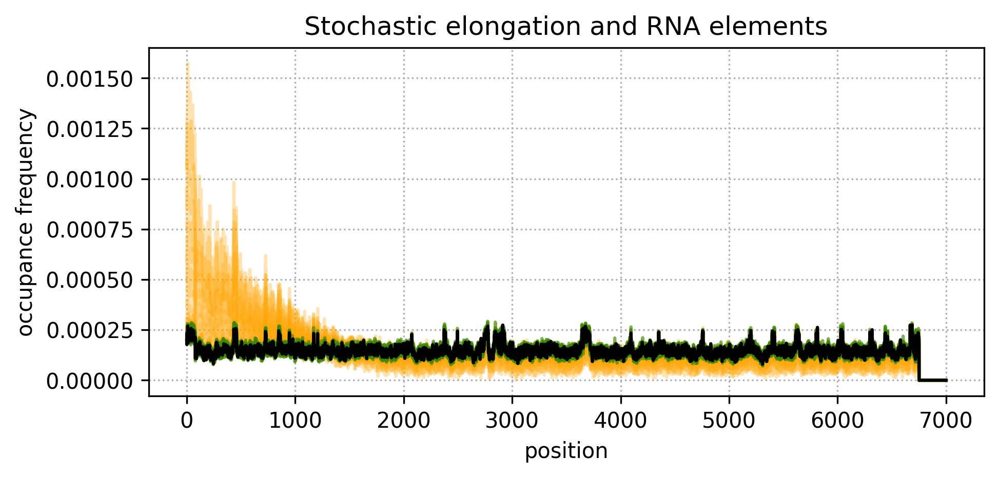

In [33]:
figsize=(7,3)

fig = plt.figure(figsize=figsize, dpi=300)
ax1 = fig.add_subplot()
a = df01_plots.index.tolist()

for i in d.index:       
    b = df01_plots[i].tolist()
    b = [np.nan]+b[1:]
    
    ax1.plot(a ,b ,label=i, c='orange',alpha=0.3)
    if d.loc[i]['preTermProb'] < 0.6:
        ax1.plot(a ,b ,label=i, c='green',alpha=0.5)
    if d.loc[i]['preTermProb'] == 0.0:
        ax1.plot(a ,b ,label=i, c='black')

# ax1.legend()
ax1.grid(True,ls="dotted")
ax1.set_xlabel('position')
ax1.set_ylabel('occupance frequency')
plt.title('Stochastic elongation and RNA elements')
plt.savefig(fname="Fig_model_SG.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

In [34]:
d = data[(data['modelType']=='fullnoLTRpreElong')].sort_values("preTermProb",ascending=False)
d

,time,c,dist,v5end,addProb,vInt,preTermProb,preTermDist,nParticles,xEnd,xEndPremature,tTaken,processivity,modelType
fullnoLTRpreElong_0.8_term_10,6000.0,500.0,0.0,0.0,0.8,50.0,10.0,2000.0,11.532437,38020.3125,168717.1875,97.977415,0.183906,fullnoLTRpreElong
fullnoLTRpreElong_0.8_term_9,6000.0,500.0,0.0,0.0,0.8,50.0,9.0,2000.0,12.948562,43453.125,162984.375,99.797403,0.21049,fullnoLTRpreElong
fullnoLTRpreElong_0.8_term_8,6000.0,500.0,0.0,0.0,0.8,50.0,8.0,2000.0,14.510125,49340.625,156337.5,101.248585,0.239892,fullnoLTRpreElong
fullnoLTRpreElong_0.8_term_7,6000.0,500.0,0.0,0.0,0.8,50.0,7.0,2000.0,16.345312,56615.625,149315.625,102.80864,0.274925,fullnoLTRpreElong
fullnoLTRpreElong_0.8_term_6,6000.0,500.0,0.0,0.0,0.8,50.0,6.0,2000.0,18.4075,64420.3125,140728.125,104.426647,0.314018,fullnoLTRpreElong
fullnoLTRpreElong_0.8_term_5,6000.0,500.0,0.0,0.0,0.8,50.0,5.0,2000.0,21.082375,74901.5625,129145.3125,106.008651,0.36708,fullnoLTRpreElong
fullnoLTRpreElong_0.8_term_4,6000.0,500.0,0.0,0.0,0.8,50.0,4.0,2000.0,24.557125,88921.875,115556.25,107.374484,0.434872,fullnoLTRpreElong
fullnoLTRpreElong_0.8_term_3,6000.0,500.0,0.0,0.0,0.8,50.0,3.0,2000.0,28.847812,106350.0,96801.5625,109.075961,0.523501,fullnoLTRpreElong
fullnoLTRpreElong_0.8_term_2,6000.0,500.0,0.0,0.0,0.8,50.0,2.0,2000.0,34.19425,128371.875,74278.125,110.741276,0.633466,fullnoLTRpreElong
fullnoLTRpreElong_0.8_term_1,6000.0,500.0,0.0,0.0,0.8,50.0,1.0,2000.0,41.547375,158550.0,42965.625,112.716867,0.786788,fullnoLTRpreElong


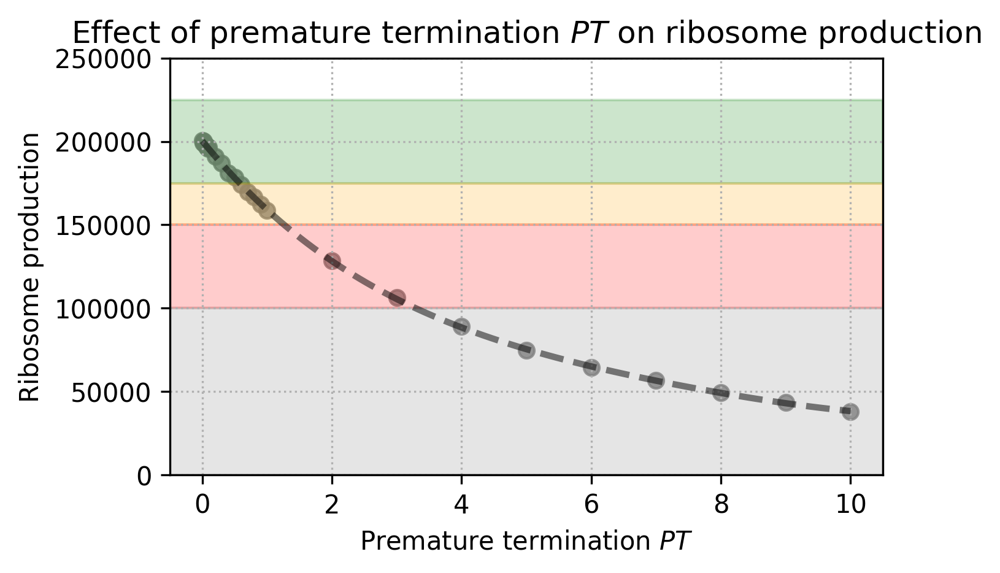

In [53]:
figsize=(5,3)
dpi=300

fig = plt.figure(figsize=figsize, dpi=dpi)
ax1 = fig.add_subplot()

# x = d['preTermProb'].multiply(2.0/7.0).tolist()
x = d['preTermProb'].tolist()
y = d['xEnd'].tolist()

ax1.scatter(x ,y, color='grey',alpha=0.8)

# #points labels
# s = [str(i) for i in d['preTermProb'].tolist()]
# for t in zip(x,y,s):
#     ax1.text(t[0],t[1]-20000,t[2])

# fit regression line
z = np.polyfit(x, y, deg=4)
p2 = np.poly1d(z)

# Plot regression line
xseq = np.linspace(0, 10, num=100)
ax1.plot(xseq, p2(xseq), "--", color="k", lw=2.5, alpha=0.5)
    
# ax1.set_xlim(0,1)
ax1.set_ylim(0,250000)

# ax1.axvspan(40,60,color='green',alpha=0.1)
ax1.axhspan(175000,225000,color='green',alpha=0.2)
ax1.axhspan(150000,175000,color='orange',alpha=0.2)
ax1.axhspan(100000,150000,color='red',alpha=0.2)
ax1.axhspan(0,100000,color='grey',alpha=0.2)

ax1.grid(True,ls="dotted")
ax1.set_xlabel('Premature termination '+'$\it{PT}$')
ax1.set_ylabel('Ribosome production')
plt.title('Effect of premature termination '+'$\it{PT}$'+' on ribosome production')
plt.savefig(fname="Fig_model_C.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

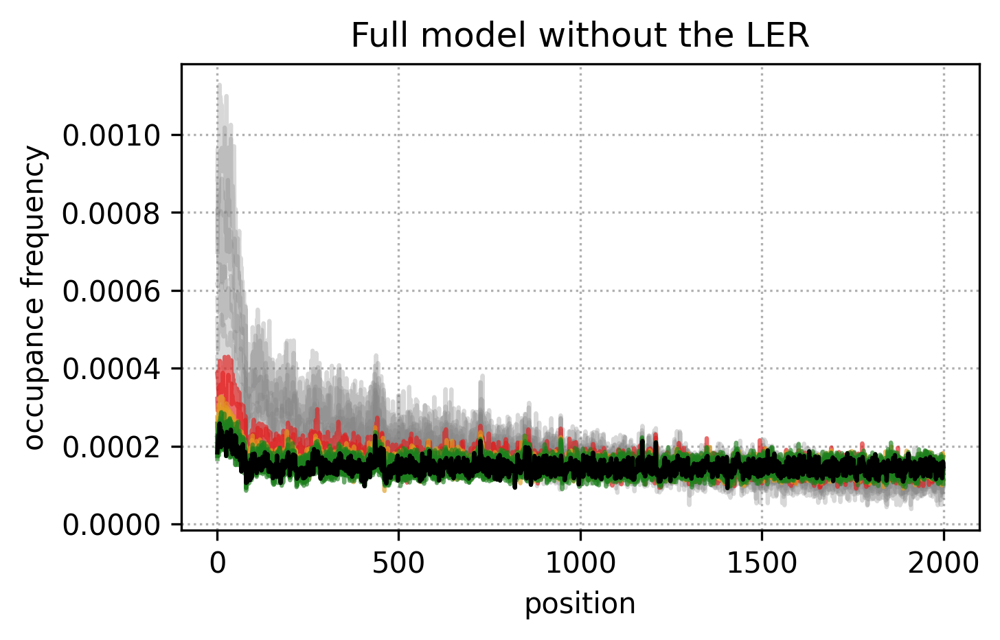

In [54]:
figsize=(5,3)

fig = plt.figure(figsize=figsize, dpi=300)
ax1 = fig.add_subplot()
a = df01_plots[:2000].index.tolist()

for i in d.index:       
    b = df01_plots[i][:2000].tolist()
    b = [np.nan]+b[1:]
    
    ax1.plot(a ,b ,label=i, c='grey',alpha=0.3)
    if d.loc[i]['preTermProb'] <= 0.6:
        ax1.plot(a ,b ,label=i, c='green',alpha=0.5)
    if (d.loc[i]['preTermProb'] <= 1) and (d.loc[i]['preTermProb'] > 0.6):
        ax1.plot(a ,b ,label=i, c='orange',alpha=0.5)
    if (d.loc[i]['preTermProb'] <= 3) and (d.loc[i]['preTermProb'] > 1):
        ax1.plot(a ,b ,label=i, c='red',alpha=0.5)
    if d.loc[i]['preTermProb'] == 0.0:
        ax1.plot(a ,b ,label=i, c='black')

# ax1.legend()
ax1.grid(True,ls="dotted")
ax1.set_xlabel('position')
ax1.set_xticks(np.arange(0,2001,500))
ax1.set_ylabel('occupance frequency')
plt.title('Full model without the LER')
plt.savefig(fname="Fig_model_D.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

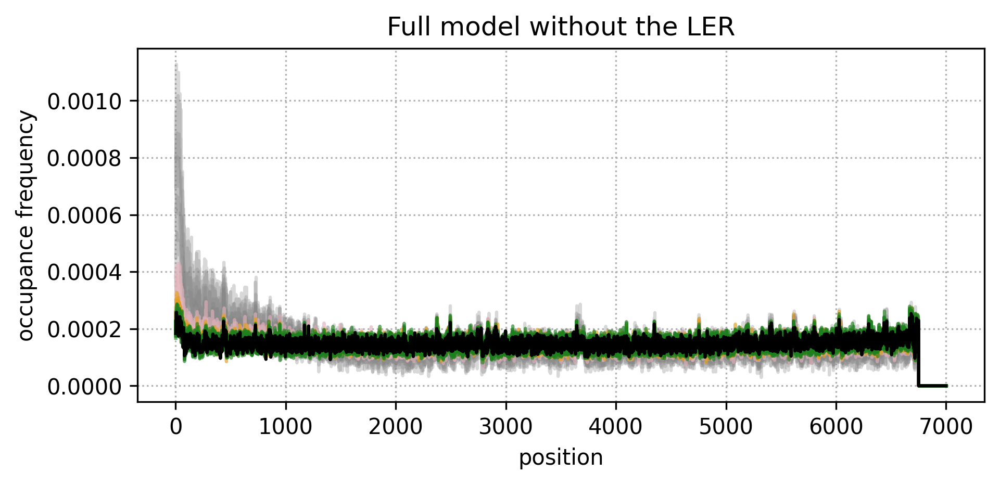

In [52]:
figsize=(7,3)

fig = plt.figure(figsize=figsize, dpi=300)
ax1 = fig.add_subplot()
a = df01_plots.index.tolist()

for i in d.index:       
    b = df01_plots[i].tolist()
    b = [np.nan]+b[1:]
    
    ax1.plot(a ,b ,label=i, c='grey',alpha=0.3)
    if d.loc[i]['preTermProb'] <= 0.6:
        ax1.plot(a ,b ,label=i, c='green',alpha=0.5)
    if (d.loc[i]['preTermProb'] <= 1) and (d.loc[i]['preTermProb'] > 0.6):
        ax1.plot(a ,b ,label=i, c='orange',alpha=0.5)
    if (d.loc[i]['preTermProb'] <= 3) and (d.loc[i]['preTermProb'] > 1):
        ax1.plot(a ,b ,label=i, c='pink',alpha=0.5)
    if d.loc[i]['preTermProb'] == 0.0:
        ax1.plot(a ,b ,label=i, c='black')

# ax1.legend()
ax1.grid(True,ls="dotted")
ax1.set_xlabel('position')
ax1.set_ylabel('occupance frequency')
plt.title('Full model without the LER')
plt.savefig(fname="Fig_model_D.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

In [36]:
d = data[(data['modelType']=='full')].sort_values("preTermProb",ascending=False)
d

,time,c,dist,v5end,addProb,vInt,preTermProb,preTermDist,nParticles,xEnd,xEndPremature,tTaken,processivity,modelType
full_0.8_term_1.0,6000.0,500.0,2000.0,0.2,0.8,50.0,1.0,6750.0,29.717125,80428.125,98217.1875,108.315934,0.450211,full
full_0.8_term_0.9,6000.0,500.0,2000.0,0.2,0.8,50.0,0.9,6750.0,30.9245,85921.875,92737.5,109.062394,0.480926,full
full_0.8_term_0.8,6000.0,500.0,2000.0,0.2,0.8,50.0,0.8,6750.0,32.202312,93210.9375,84534.375,110.286253,0.524407,full
full_0.8_term_0.7,6000.0,500.0,2000.0,0.2,0.8,50.0,0.7,6750.0,33.646937,99900.0,78356.25,111.166268,0.560429,full
full_0.8_term_0.6,6000.0,500.0,2000.0,0.2,0.8,50.0,0.6,6750.0,35.201937,108112.5,69965.625,112.176288,0.607107,full
full_0.8_term_0.5,6000.0,500.0,2000.0,0.2,0.8,50.0,0.5,6750.0,36.826375,116798.4375,60778.125,113.413085,0.657736,full
full_0.8_term_0.4,6000.0,500.0,2000.0,0.2,0.8,50.0,0.4,6750.0,38.842937,127134.375,51412.5,114.421104,0.71205,full
full_0.8_term_0.3,6000.0,500.0,2000.0,0.2,0.8,50.0,0.3,6750.0,40.650437,137723.4375,40321.875,115.685079,0.77353,full
full_0.8_term_0.2,6000.0,500.0,2000.0,0.2,0.8,50.0,0.2,6750.0,42.638312,149010.9375,28382.8125,116.902029,0.840001,full
full_0.8_term_0.1,6000.0,500.0,2000.0,0.2,0.8,50.0,0.1,6750.0,44.947125,162253.125,14925.0,118.25916,0.915763,full


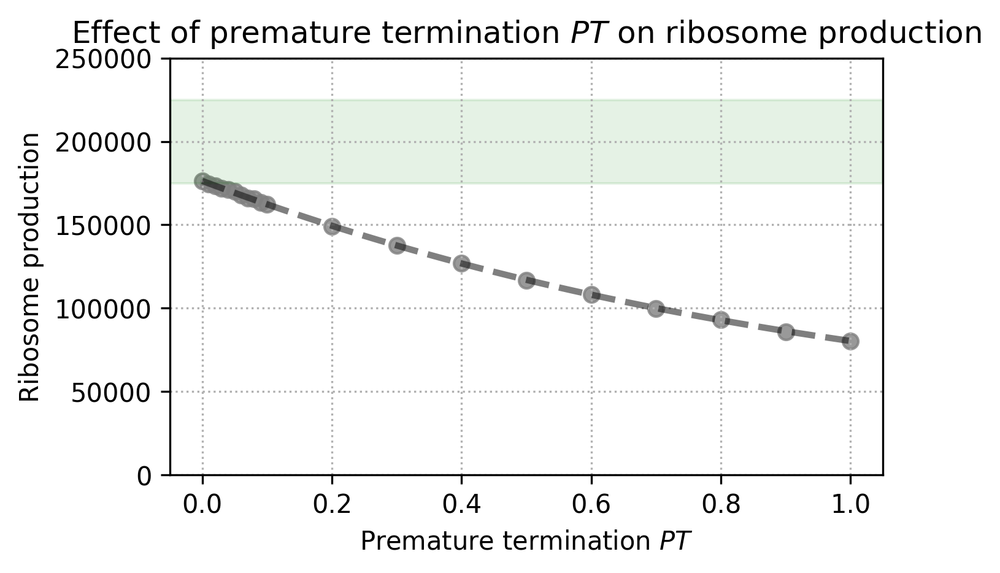

In [37]:
figsize=(5,3)
dpi=300

fig = plt.figure(figsize=figsize, dpi=dpi)
ax1 = fig.add_subplot()

x = d['preTermProb'].tolist()
y = d['xEnd'].tolist()

ax1.scatter(x ,y, color='grey',alpha=0.8)

# #points labels
# s = [str(i) for i in d['preTermProb'].tolist()]
# for t in zip(x,y,s):
#     ax1.text(t[0],t[1]-20000,t[2])

# fit regression line
z = np.polyfit(x, y, deg=4)
p2 = np.poly1d(z)

# Plot regression line
xseq = np.linspace(0, 1, num=100)
ax1.plot(xseq, p2(xseq), "--", color="k", lw=2.5, alpha=0.5)
    
# ax1.set_xlim(0,1)
ax1.set_ylim(0,250000)

# ax1.axvspan(40,60,color='green',alpha=0.1)
ax1.axhspan(175000,225000,color='green',alpha=0.1)

ax1.grid(True,ls="dotted")
ax1.set_xlabel('Premature termination '+'$\it{PT}$')
ax1.set_ylabel('Ribosome production')
plt.title('Effect of premature termination '+'$\it{PT}$'+' on ribosome production')
plt.savefig(fname="Fig_model_B.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

In [38]:
d = data[(data['modelType']=='torsion')]
d

,time,c,dist,v5end,addProb,vInt,preTermProb,preTermDist,nParticles,xEnd,xEndPremature,tTaken,processivity,modelType
torsion_0.8_term_0,6000.0,500.0,0.0,0.0,0.8,50.0,0.0,6750.0,70.565625,210178.125,0.0,146.931055,1.0,torsion
torsion_0.8_term_0.01,6000.0,500.0,0.0,0.0,0.8,50.0,0.01,6750.0,69.794062,207285.9375,2437.5,146.569468,0.988378,torsion
torsion_0.8_term_0.02,6000.0,500.0,0.0,0.0,0.8,50.0,0.02,6750.0,69.890437,205129.6875,4729.6875,146.31834,0.977463,torsion
torsion_0.8_term_0.03,6000.0,500.0,0.0,0.0,0.8,50.0,0.03,6750.0,69.060937,203254.6875,6787.5,146.018131,0.967685,torsion
torsion_0.8_term_0.04,6000.0,500.0,0.0,0.0,0.8,50.0,0.04,6750.0,67.677312,200709.375,8896.875,145.771164,0.957554,torsion
torsion_0.8_term_0.05,6000.0,500.0,0.0,0.0,0.8,50.0,0.05,6750.0,67.437437,198909.375,10846.875,145.55847,0.948288,torsion
torsion_0.8_term_0.06,6000.0,500.0,0.0,0.0,0.8,50.0,0.06,6750.0,66.775125,196176.5625,12975.0,145.306838,0.937964,torsion
torsion_0.8_term_0.07,6000.0,500.0,0.0,0.0,0.8,50.0,0.07,6750.0,66.507875,195009.375,15042.1875,145.056552,0.928388,torsion
torsion_0.8_term_0.08,6000.0,500.0,0.0,0.0,0.8,50.0,0.08,6750.0,66.3095,192754.6875,17334.375,144.888042,0.91749,torsion
torsion_0.8_term_0.09,6000.0,500.0,0.0,0.0,0.8,50.0,0.09,6750.0,65.648187,191165.625,19664.0625,144.637473,0.90673,torsion


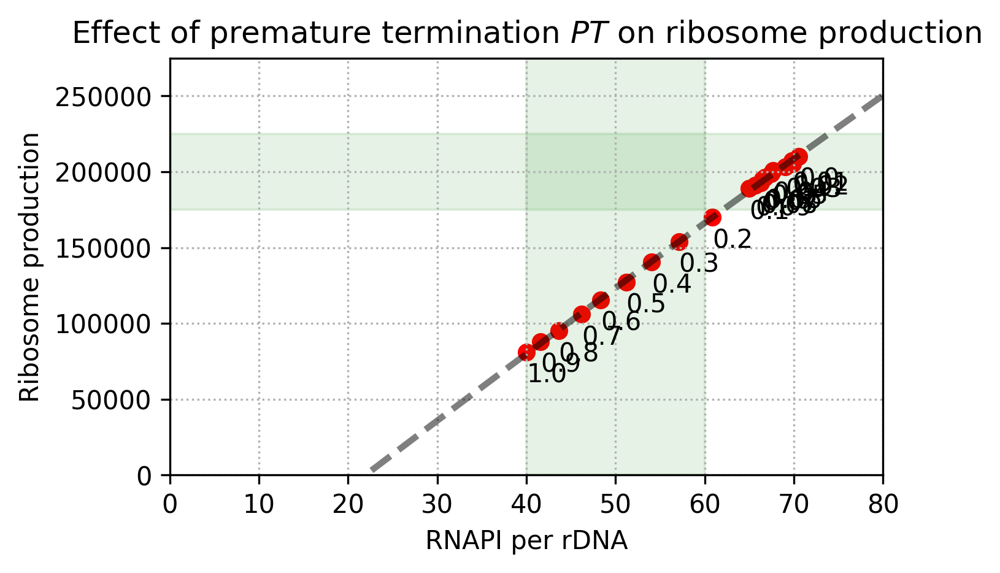

In [39]:
figsize=(5,3)
dpi=300

fig = plt.figure(figsize=figsize, dpi=dpi)
ax1 = fig.add_subplot()

x = d['nParticles'].tolist()
y = d['xEnd'].tolist()

ax1.scatter(x ,y, color='red')

#points labels
s = [str(i) for i in d['preTermProb'].tolist()]
for t in zip(x,y,s):
    ax1.text(t[0],t[1]-20000,t[2])

# fit regression line
z = np.polyfit(x, y, deg=2)
p2 = np.poly1d(z)

# Plot regression line
xseq = np.linspace(0, 90, num=100)
ax1.plot(xseq, p2(xseq), "--", color="k", lw=2.5, alpha=0.5)
    
ax1.set_xlim(0,80)
ax1.set_ylim(0,275000)

ax1.axvspan(40,60,color='green',alpha=0.1)
ax1.axhspan(175000,225000,color='green',alpha=0.1)

ax1.grid(True,ls="dotted")
ax1.set_xlabel('RNAPI per rDNA')
ax1.set_ylabel('Ribosome production')
plt.title('Effect of premature termination '+'$\it{PT}$'+' on ribosome production')
plt.savefig(fname="Fig_N_A.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)

In [40]:
d = data[(data['modelType']=='LER')]
d

,time,c,dist,v5end,addProb,vInt,preTermProb,preTermDist,nParticles,xEnd,xEndPremature,tTaken,processivity,modelType
LER_0.8_term_0,6000.0,500.0,2000.0,0.2,0.8,50.0,0.0,6750.0,64.507812,189117.1875,0.0,151.62325,1.0,LER
LER_0.8_term_0.01,6000.0,500.0,2000.0,0.2,0.8,50.0,0.01,6750.0,64.856937,188850.0,2334.375,151.355183,0.98779,LER
LER_0.8_term_0.02,6000.0,500.0,2000.0,0.2,0.8,50.0,0.02,6750.0,64.12475,186178.125,4551.5625,151.097892,0.976136,LER
LER_0.8_term_0.03,6000.0,500.0,2000.0,0.2,0.8,50.0,0.03,6750.0,63.57675,183389.0625,6571.875,150.857982,0.965404,LER
LER_0.8_term_0.04,6000.0,500.0,2000.0,0.2,0.8,50.0,0.04,6750.0,62.92425,181631.25,8015.625,150.735955,0.957734,LER
LER_0.8_term_0.05,6000.0,500.0,2000.0,0.2,0.8,50.0,0.05,6750.0,62.661687,179896.875,10645.3125,150.504044,0.944131,LER
LER_0.8_term_0.06,6000.0,500.0,2000.0,0.2,0.8,50.0,0.06,6750.0,62.075625,177506.25,12384.375,150.338465,0.934782,LER
LER_0.8_term_0.07,6000.0,500.0,2000.0,0.2,0.8,50.0,0.07,6750.0,61.482312,174820.3125,14835.9375,150.118036,0.921775,LER
LER_0.8_term_0.08,6000.0,500.0,2000.0,0.2,0.8,50.0,0.08,6750.0,61.52225,174445.3125,16307.8125,149.973169,0.914508,LER
LER_0.8_term_0.09,6000.0,500.0,2000.0,0.2,0.8,50.0,0.09,6750.0,60.891312,171998.4375,17967.1875,149.766745,0.905419,LER


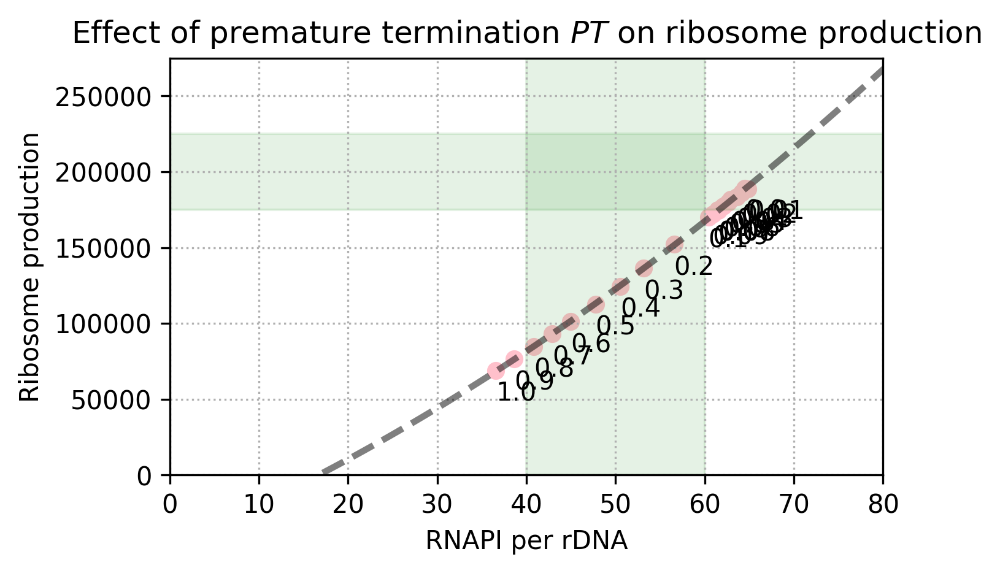

In [41]:
figsize=(5,3)
dpi=300

fig = plt.figure(figsize=figsize, dpi=dpi)
ax1 = fig.add_subplot()

x = d['nParticles'].tolist()
y = d['xEnd'].tolist()

ax1.scatter(x ,y, color='pink')

#points labels
s = [str(i) for i in d['preTermProb'].tolist()]
for t in zip(x,y,s):
    ax1.text(t[0],t[1]-20000,t[2])

# fit regression line
z = np.polyfit(x, y, deg=2)
p2 = np.poly1d(z)

# Plot regression line
xseq = np.linspace(0, 90, num=100)
ax1.plot(xseq, p2(xseq), "--", color="k", lw=2.5, alpha=0.5)
    
ax1.set_xlim(0,80)
ax1.set_ylim(0,275000)

ax1.axvspan(40,60,color='green',alpha=0.1)
ax1.axhspan(175000,225000,color='green',alpha=0.1)

ax1.grid(True,ls="dotted")
ax1.set_xlabel('RNAPI per rDNA')
ax1.set_ylabel('Ribosome production')
plt.title('Effect of premature termination '+'$\it{PT}$'+' on ribosome production')
plt.savefig(fname="Fig_N_A.png",dpi=dpi,format='png',bbox_inches='tight', transparent=False)